<a href="https://colab.research.google.com/github/ajinkyajumde/NETFLIX/blob/main/Copy_of_Copy_of_TEAM_REALITY_NETFLIX_MOVIES_AND_TV_SHOWS_CLUSTERING.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Problem Statement**

This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.

## <b>In this  project, you are required to do </b>
1. Exploratory Data Analysis 

2. Understanding what type content is available in different countries

3. Is Netflix has increasingly focusing on TV rather than movies in recent years.
4. Clustering similar content by matching text-based features



# **Attribute Information**

1. show_id : Unique ID for every Movie / Tv Show

2. type : Identifier - A Movie or TV Show

3. title : Title of the Movie / Tv Show

4. director : Director of the Movie

5. cast : Actors involved in the movie / show

6. country : Country where the movie / show was produced

7. date_added : Date it was added on Netflix

8. release_year : Actual Releaseyear of the movie / show

9. rating : TV Rating of the movie / show

10. duration : Total Duration - in minutes or number of seasons

11. listed_in : Genere

12. description: The Summary description

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Import Packages

In [2]:
#necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno


# Preliminary Analysis

In [3]:
#read the data
df = pd.read_csv('/content/drive/MyDrive/Almabetter projects/unsupervised learning/Copy of NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

In [4]:
#head of data
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [5]:
#tail of data
df.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


In [6]:
#basic info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


In [7]:
#basic stat description
df.describe(include = 'all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


## Checking Duplicates if any

In [8]:
# check duplicates
df[df.duplicated()]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description


## Checking for Missing Values

In [9]:

df.isnull().sum().sort_values(ascending=False)

director        2389
cast             718
country          507
date_added        10
rating             7
show_id            0
type               0
title              0
release_year       0
duration           0
listed_in          0
description        0
dtype: int64

* 2389 nulls in 'director'
* 718 in 'cast'
* 507 in 'country'
* 10 in 'date_added'
* 7 in rating

<BarContainer object of 12 artists>

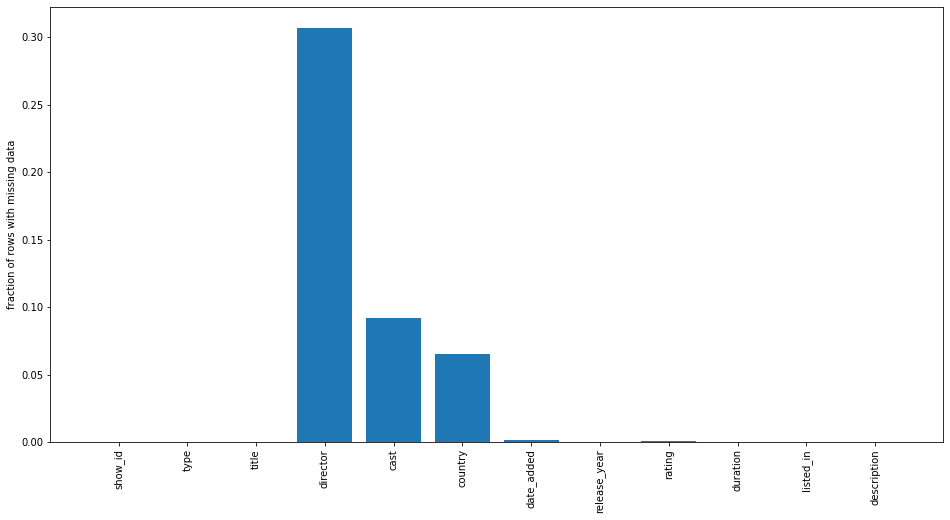

In [10]:
# null value distribution
null_counts = df.isnull().sum()/len(df)
plt.figure(figsize=(16,8))
plt.xticks(np.arange(len(null_counts)),null_counts.index,rotation='vertical')
plt.ylabel('fraction of rows with missing data')
plt.bar(np.arange(len(null_counts)),null_counts)

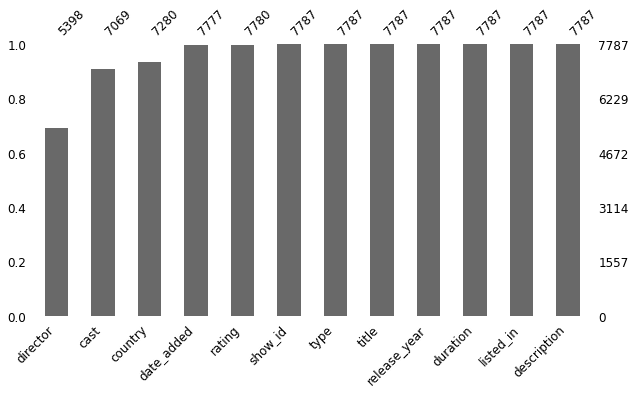

In [11]:
# null value distribution
msno.bar(df, log=False, sort='ascending', figsize=(10,5), fontsize=12)

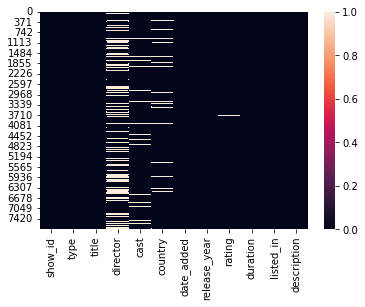

In [12]:
#null value heatmap
sns.heatmap(df.isnull())

In [13]:
#Looking for unique values
df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

# Univariate Analysis before Clustering

# 1. Type Column

In [14]:
df.type.value_counts()

Movie      5377
TV Show    2410
Name: type, dtype: int64

In [15]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10,10)

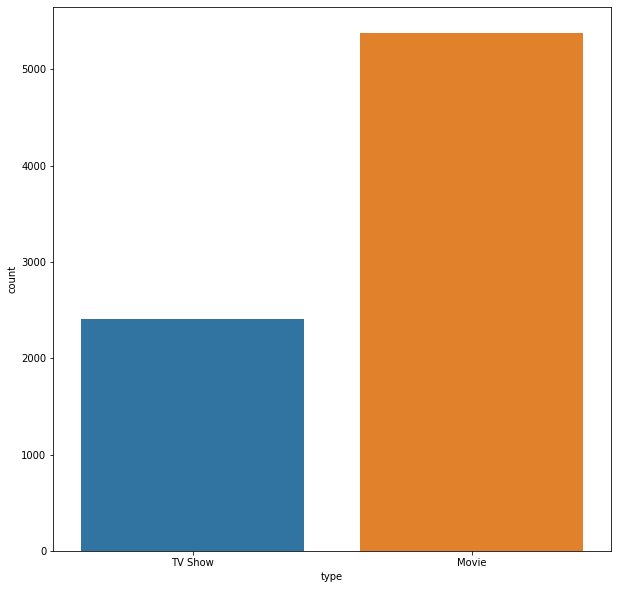

In [16]:
sns.countplot(x='type', data = df)

### **Inference:** Almost 70% of datapoints belong to Movie, rest 30% to TV Show

# 2. Title Column

In [17]:
#number unique points
df.title.nunique()

7787

In [18]:
#word cloud imports
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


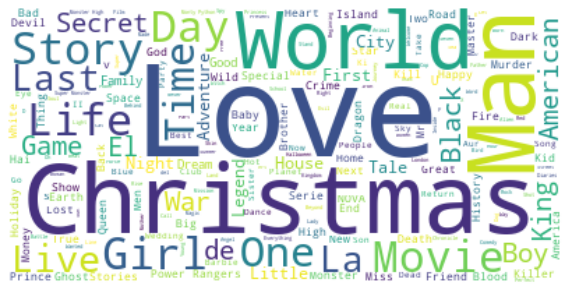

In [19]:
#subsetting df
df_word_cloud = df['title']
text = " ".join(word for word in df_word_cloud)
# Create stopword list:
stopwords = set(STOPWORDS)
# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### **Inference:** It seems like words like "Love", "Man", "World", "Story" are very common in titles.
However, we are suprised by the overwhelming number of content having "Christmas" in their title.

We are suspecting "Christmas" titles to be a very seasonal thing with most of the shows likely to be released during the onth of December. However, we do not have the release month in this data to conform my hypothesis.

In [20]:
df.title

0                                            3%
1                                          7:19
2                                         23:59
3                                             9
4                                            21
                         ...                   
7782                                       Zozo
7783                                     Zubaan
7784                          Zulu Man in Japan
7785                      Zumbo's Just Desserts
7786    ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS
Name: title, Length: 7787, dtype: object

# 3. Director

In [21]:
#number of unique dir
df.director.nunique()

4049

In [22]:
#looking at director series
df.director

0                     NaN
1       Jorge Michel Grau
2            Gilbert Chan
3             Shane Acker
4          Robert Luketic
              ...        
7782          Josef Fares
7783          Mozez Singh
7784                  NaN
7785                  NaN
7786             Sam Dunn
Name: director, Length: 7787, dtype: object

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


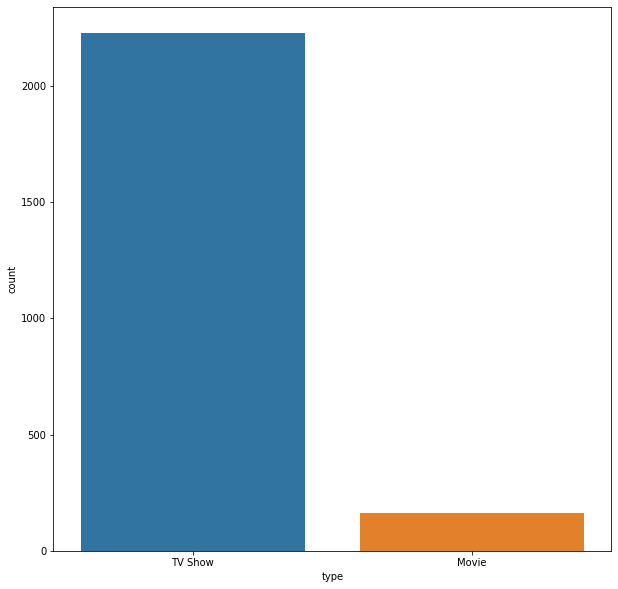

In [23]:
#Looking for which category have maximum nulls in director column
missing_df=df[df['director'].isna()]
sns.countplot(missing_df['type'])

### **Inference:** Most of the missing columns of directors are for TV Shows, pretty interesting!

In [24]:
#missing count split for director
missing_df['type'].value_counts()

TV Show    2226
Movie       163
Name: type, dtype: int64

TV shows misses most of the director detailes

## Top 20 Directors with most number of Movies/Shows on Netflix

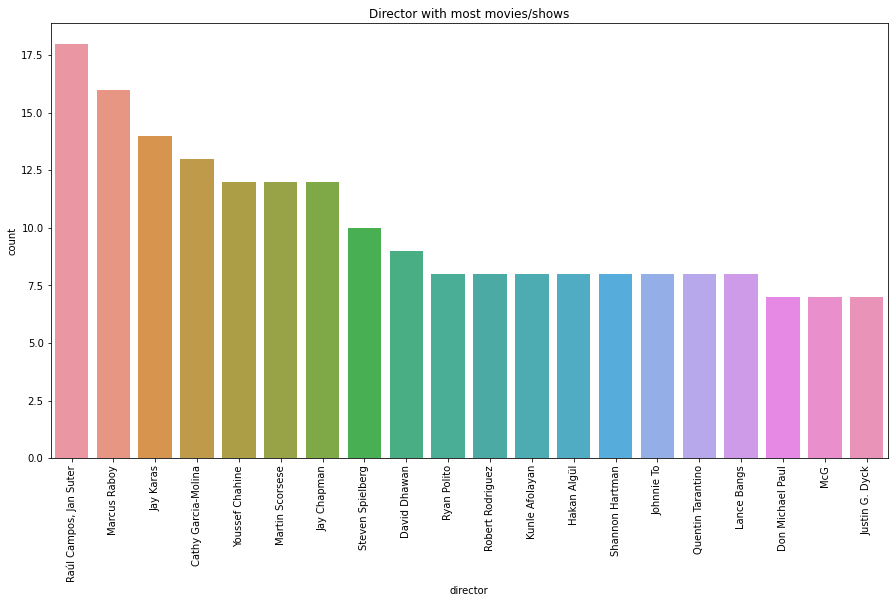

In [25]:
#plot for director
plt.figure(figsize = (15,8))
sns.countplot(x='director',data=df,order=df.director.value_counts().head(20).index)
plt.title('Director with most movies/shows')
plt.xticks(rotation = 90)
plt.show()

In [26]:
#since there are many crows with nan director, we have filled it using empty string
df['director']=df['director'].fillna('')

# 4. Cast 

In [27]:
#unique number of cast
df.cast.nunique()

6831

In [28]:
#missing dealth with emprty string replacing
df_actors = df['cast'].fillna('')

In [29]:
df_actors.isnull().sum()

0

In [30]:
df_actors

0       João Miguel, Bianca Comparato, Michel Gomes, R...
1       Demián Bichir, Héctor Bonilla, Oscar Serrano, ...
2       Tedd Chan, Stella Chung, Henley Hii, Lawrence ...
3       Elijah Wood, John C. Reilly, Jennifer Connelly...
4       Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...
                              ...                        
7782    Imad Creidi, Antoinette Turk, Elias Gergi, Car...
7783    Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...
7784                                              Nasty C
7785                           Adriano Zumbo, Rachel Khoo
7786                                                     
Name: cast, Length: 7787, dtype: object

In [31]:
#convert the actor to get final df for actor
def convert_to_list(df):
  cast_count = {}
  cast_count_final = []
  cast_list = list(df['cast'])
  for each in range(len(cast_list)):
    cast_count_final.extend(str(cast_list[each]).split(","))
  for each in cast_count_final:
    if each not in cast_count:
      cast_count[each] = cast_count_final.count(each)
  return cast_count

In [32]:
cast_df = convert_to_list(df)

In [33]:
#dataframe for cast v/s count
casts_df = pd.DataFrame.from_dict(cast_df, orient='index', columns=['count'])

## Top Actors with highest count of Movies

In [34]:
#highest number movie for actors
casts_df.sort_values('count', ascending=False).drop('nan')

,count
Anupam Kher,38
Takahiro Sakurai,28
Shah Rukh Khan,27
Om Puri,27
Boman Irani,25
...,...
Juan Manuel Diaz,1
Ana Wills,1
Mauricio Figueroa,1
Matias Maldonado,1


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39]), <a list of 40 Text major ticklabel objects>)

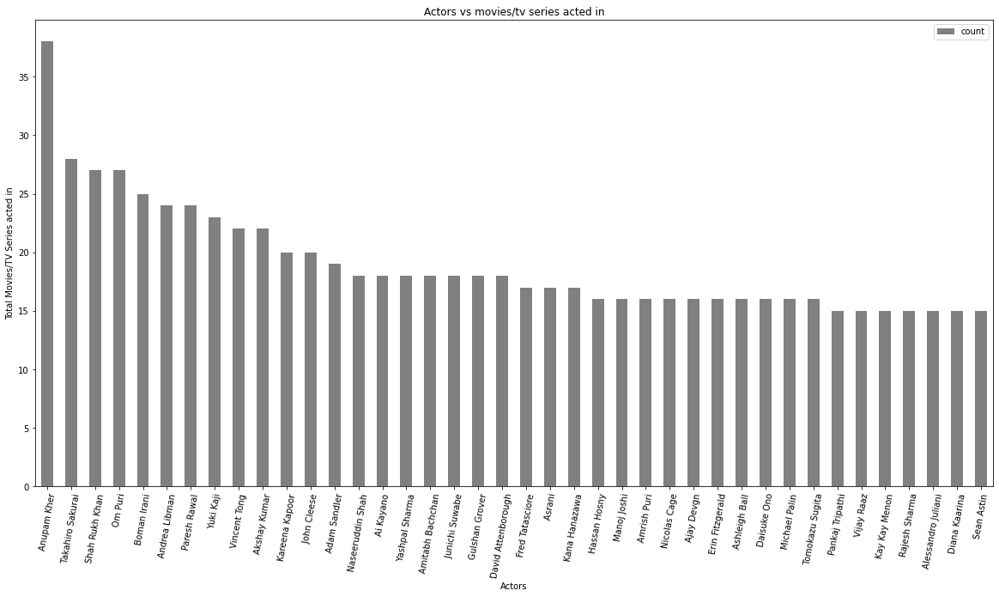

In [35]:
  # plot for top actors and count
  plt.rcParams["figure.figsize"] = (20, 10)
  casts_df.sort_values('count', ascending=False).drop('nan').head(40).plot(kind='bar', color='grey')
  plt.xlabel("Actors")
  plt.ylabel("Total Movies/TV Series acted in")
  plt.title("Actors vs movies/tv series acted in")
  plt.xticks(rotation=80)

In [36]:
#replacing cast with also empty string
df['cast']=df['cast'].fillna('')


# 5. Country

In [37]:
#count of unique column
df.country.nunique()

681

In [38]:
# Looking for countries and number of netflix productions
country_list=[]
tv_show=[]
movies=[]
for i in range(0,len(df)):
  if type(df['country'][i])== str:
    split=df['country'][i].split(',')
    for k in split:
      country_list.append(k.strip())
      if df['type'][i]=='TV Show':
        tv_show.append(k.strip())
      if df['type'][i]== 'Movie':
        movies.append(k.strip())
production_country=list(set([(i,country_list.count(i),tv_show.count(i),movies.count(i)) for i in country_list]))

In [39]:
country_df= pd.DataFrame(production_country,columns=['country','Productions','TV-Shows','Movies']) 
country_df=country_df.sort_values('Productions',ascending=False)
country_df=country_df.reset_index()
country_df=country_df.drop('index',axis=1)

## Top 20 Countries with more number of Productions

In [40]:
#Top 20 countries
top_countries=country_df.head(20)
top_countries = top_countries[top_countries['country']!='']
top_countries

,country,Productions,TV-Shows,Movies
0,United States,3297,866,2431
1,India,990,75,915
2,United Kingdom,723,256,467
3,Canada,412,126,286
4,France,349,84,265
5,Japan,287,184,103
6,Spain,215,57,158
7,South Korea,212,157,55
8,Germany,199,42,157
9,Mexico,154,53,101


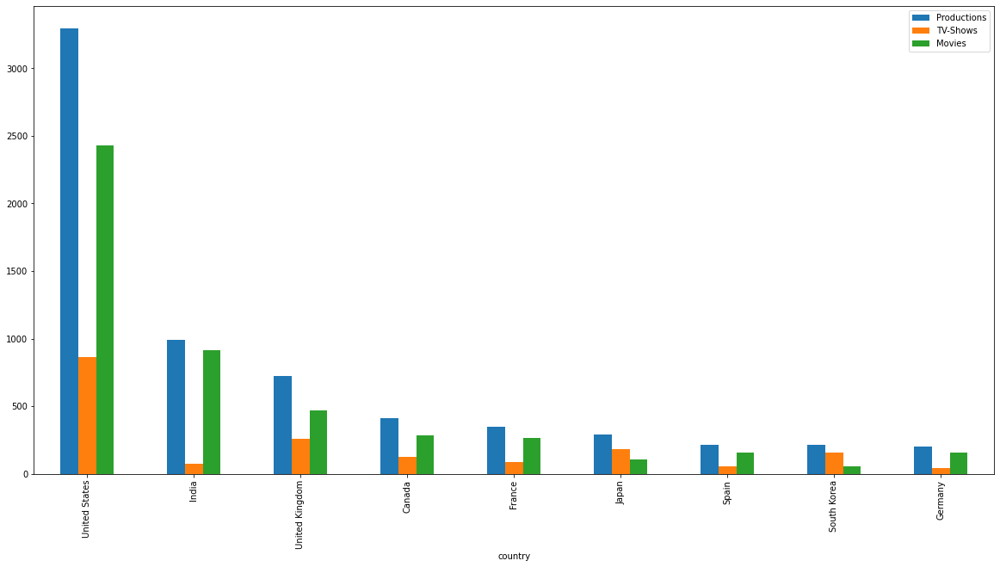

In [41]:
top_countries.head(9).plot(x="country", y=['Productions','TV-Shows','Movies'], kind="bar")

# 6. Date Added

In [42]:
#changed date added to datetime object 
df["date_added"] = pd.to_datetime(df['date_added'])
df['year_added'] = df['date_added'].dt.year
df['month_added'] = df['date_added'].dt.month

# 7. Release Year

## Count plot for releases over years

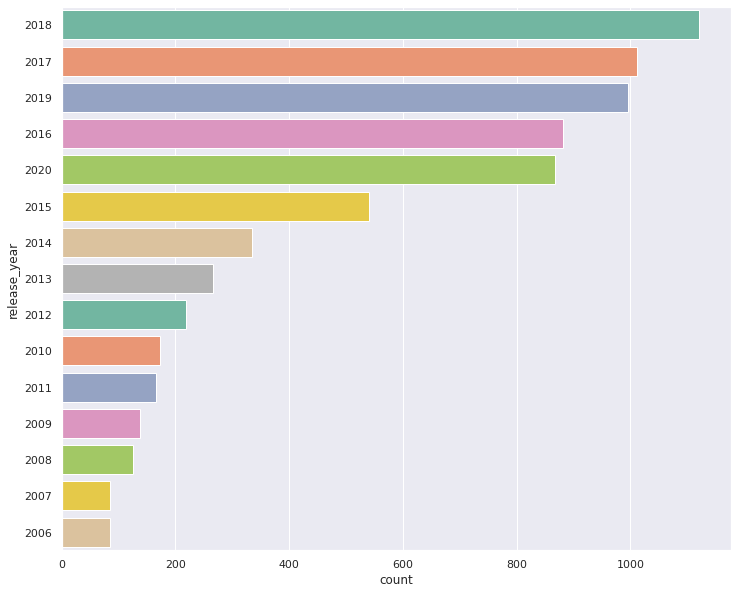

In [43]:
plt.figure(figsize=(12,10))
sns.set(style="darkgrid")
ax = sns.countplot(y="release_year", data=df, palette="Set2", order=df['release_year'].value_counts().index[0:15])

# 8. Rating

## Rating Column Distribution by Pie Chart

In [44]:
import plotly.express as px

In [45]:
#rating column distribution by plotly
fig_donut = px.pie(df, names='rating', height=1000, width=1000, hole=0.7,

title='MOST OF PROGRAMME ON NETFLIX IS TV-14 & TV-MA RATED',

color_discrete_sequence=['#b20710', '#221f1f'])

fig_donut.update_traces(hovertemplate=None, textposition='outside',

textinfo='percent+label', rotation=90)

fig_donut.update_layout(margin=dict(t=80, b=10, l=0, r=0), showlegend=False,

plot_bgcolor='#333', paper_bgcolor='#333',

title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),

font=dict(size=17, color='#8a8d93'),

hoverlabel=dict(bgcolor="#444", font_size=13,

font_family="Lato, sans-serif"))
fig_donut.show(renderer='colab')

### **Inference:** More content with Mature content is available on Netflix.

## Rating distribution by Content Type

In [46]:
import plotly.graph_objs as go

In [47]:
df1 = df[df["type"] == "TV Show"]
df2 = df[df["type"] == "Movie"]

temp_df1 = df1['rating'].value_counts().reset_index()
temp_df2 = df2['rating'].value_counts().reset_index()


# create trace1
trace1 = go.Bar(
                x = temp_df1['index'],
                y = temp_df1['rating'],
                name="TV Shows",
                marker = dict(color = 'rgb(249, 6, 6)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))
# create trace2 
trace2 = go.Bar(
                x = temp_df2['index'],
                y = temp_df2['rating'],
                name = "Movies",
                marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))


layout = go.Layout(template= "plotly_dark",title = 'RATING BY CONTENT TYPE' , xaxis = dict(title = 'Rating'), yaxis = dict(title = 'Count'))
fig = go.Figure(data = [trace1, trace2], layout = layout)
fig.show(renderer='colab')

# 9. Duration Column

In [48]:
#duration column
df['duration']

0       4 Seasons
1          93 min
2          78 min
3          80 min
4         123 min
          ...    
7782       99 min
7783      111 min
7784       44 min
7785     1 Season
7786       90 min
Name: duration, Length: 7787, dtype: object

In [49]:
#subsetting TV Show and Movie for duration
netflix_shows=df[df['type']=='TV Show']
netflix_movies=df[df['type']=='Movie']


## Netflix Movie Duration Distribution

In [50]:
#movie duration subsetting
netflix_movies['duration']=netflix_movies['duration'].str.replace(' min','')
netflix_movies['duration']=netflix_movies['duration'].astype(str).astype(int)
netflix_movies['duration']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



1        93
2        78
3        80
4       123
6        95
       ... 
7781     88
7782     99
7783    111
7784     44
7786     90
Name: duration, Length: 5377, dtype: int64

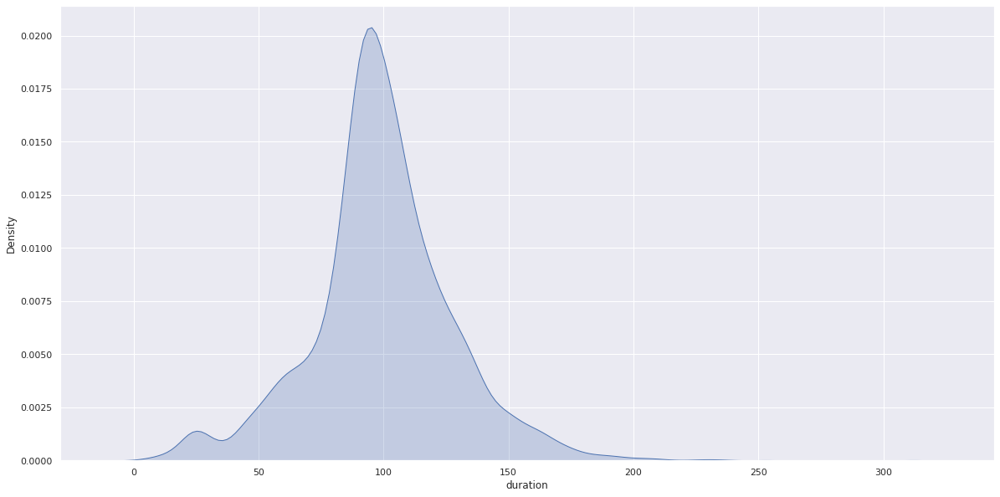

In [51]:
#Analysis on the duration of the movies 
sns.set(style="darkgrid")
sns.kdeplot(data=netflix_movies['duration'], shade=True)

###Inference: Most content are about 70 to 120 min duration for movies

## Netflix Show Duration Distribution

In [52]:
#netflix show duration analysis
netflix_shows['duration']=netflix_shows['duration'].str.replace(' Season','')
netflix_shows['duration']=netflix_shows['duration'].str.replace(' Seasons','')
netflix_shows['duration']=netflix_shows['duration'].str.replace('s','')
netflix_shows['duration']=netflix_shows['duration'].astype(str).astype(int)
netflix_shows['duration']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

0       4
5       1
11      1
12      1
16      1
       ..
7767    1
7775    1
7777    2
7779    1
7785    1
Name: duration, Length: 2410, dtype: int64

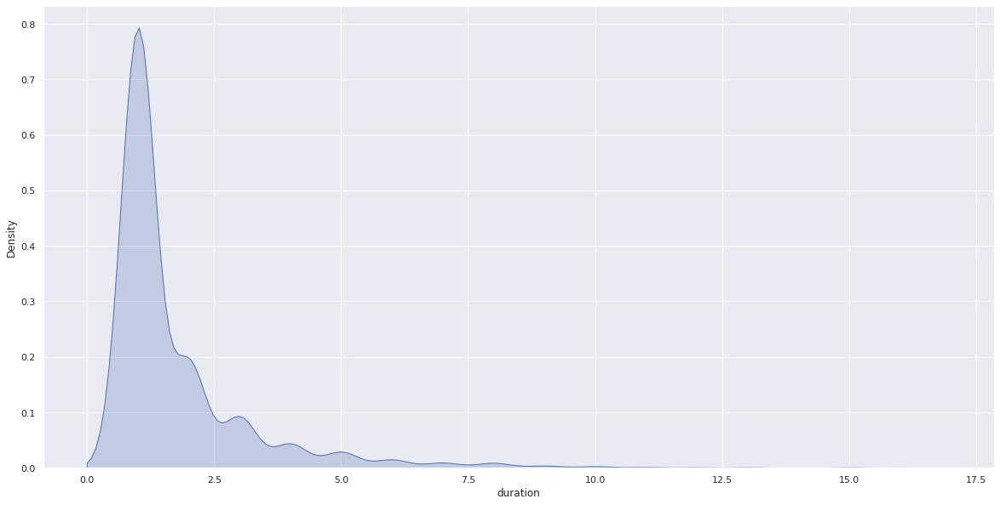

In [53]:
#Analysis on the duration of the movies 
sns.set(style="darkgrid")
sns.kdeplot(data=netflix_shows['duration'], shade=True)

### **Inference:** Most of the shows are 1 to 2 seasons long!

# 10. Listed In

In [54]:
#genre to list
def convert_to_list(df):
  genre_count = {}
  genre_count_final = []
  genre_list = list(df['listed_in'])
  for each in range(len(genre_list)):
    genre_count_final.extend(genre_list[each].split(", "))
  for each in genre_count_final:
    if each not in genre_count:
      genre_count[each] = genre_count_final.count(each)
  return genre_count

In [55]:
#to list
genre_dict = convert_to_list(df)

In [56]:
#make genre df
genre_df = pd.DataFrame.from_dict(genre_dict, orient='index', columns=['count']).sort_values('count', ascending=False)

In [57]:
#genre distribution
genre_df

,count
International Movies,2437
Dramas,2106
Comedies,1471
International TV Shows,1199
Documentaries,786
Action & Adventure,721
TV Dramas,704
Independent Movies,673
Children & Family Movies,532
Romantic Movies,531


In [58]:
len(genre_df)

42

# Genre wise Count Distribution

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41]),
 <a list of 42 Text major ticklabel objects>)

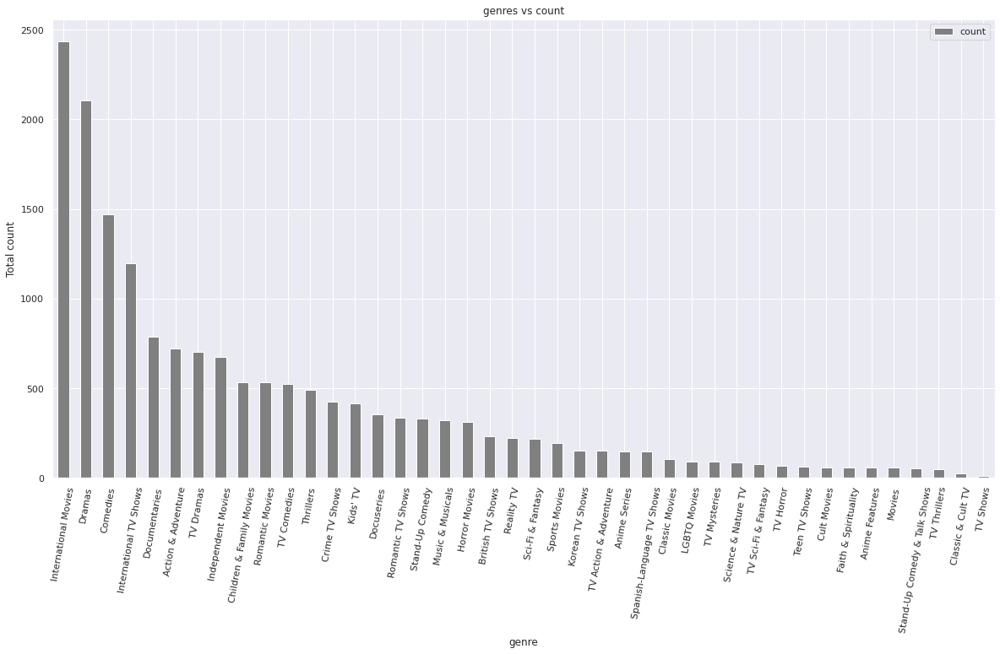

In [59]:
  plt.rcParams["figure.figsize"] = (20, 10)
  genre_df.plot(kind='bar', color='grey')
  plt.xlabel("genre")
  plt.ylabel("Total count")
  plt.title("genres vs count")
  plt.xticks(rotation=80)

##**Inference:** International Movies make up the top most genre!

In [60]:
#word cloud imports
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [61]:
#word cloud for user rating review
def func_select_Category(category_name,category_column,column_of_choice):
  df_word_cloud = df[[category_column,column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud[category_column]==category_name]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  # Create stopword list:
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
  # Display the generated image:
  # the matplotlib way:
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

# 11. Description

#Word Cloud for Movie on Description Column

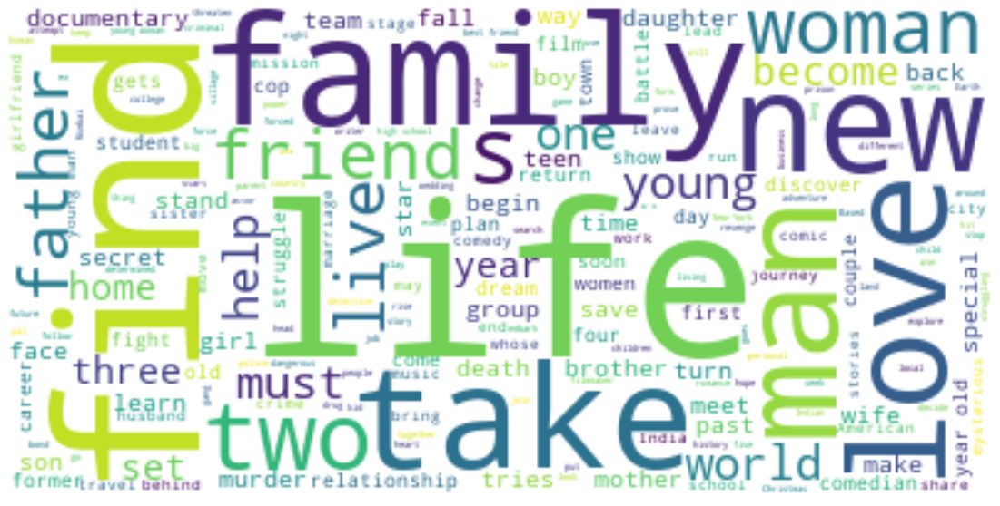

In [62]:
func_select_Category('Movie','type','description')

### **Inference:**Most words like Life, family popping up

#Word Cloud for Shows on Description Column

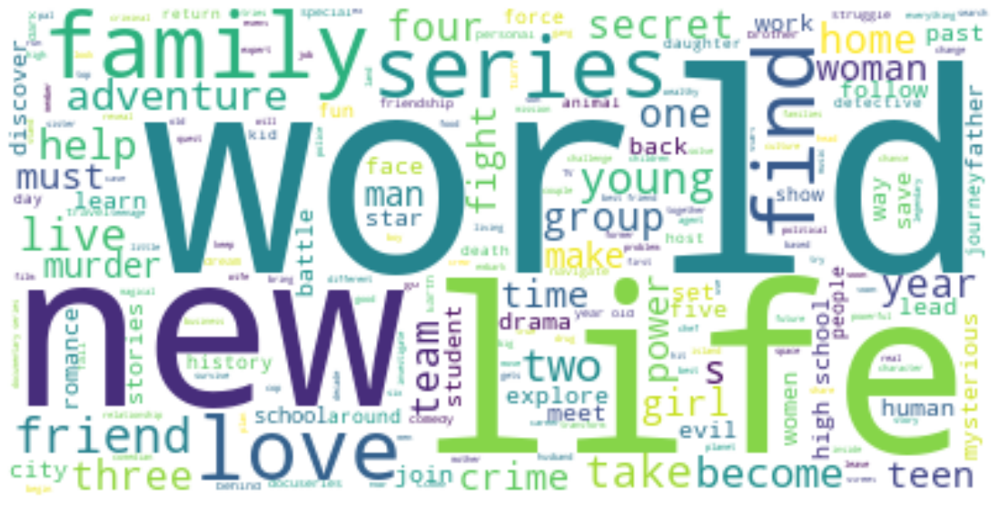

In [63]:
func_select_Category('TV Show','type','description')

### **Inference:**Most words like Life, family popping up like movies before!

# Bivariate and Trend Analysis

# Q2. Country Wise Trend Analysis

* country vs genre
* country vs rating
* country vs type
* country vs year_added
* country vs top directors
* country vs top cast
* country vs release year

#Plotting country wise trend for genre preference

## All country's genres preference were plotted

In [64]:
#genre country wise
def get_genre_country_trends(df):
  def explode_country(country):
    try:
        return country.split(", ")
    except:
        return ""
  df['country_list'] = df.apply(lambda x: explode_country(x['country']),axis=1)
  df = df.explode('country_list')
  df['genre_list'] = df.apply(lambda x: explode_country(x['listed_in']),axis=1)
  df = df.explode('genre_list')
  df.groupby(['country_list','genre_list']).agg({'title':'count'})
  grouped_df_ = df.groupby(['country_list','genre_list']).agg({'title':'count'})
  grouped_df = grouped_df_.reset_index()
  grouped_df['country_list'].values
  grouped_df = grouped_df[grouped_df.country_list != '']
  rating_country_df = grouped_df.reset_index().drop("index", axis=1)
  list_of_countries = list(set(list(rating_country_df['country_list'].values)))
  for each in list_of_countries:
    rating_country_df[rating_country_df['country_list'] == each].sort_values("title",ascending=False).plot.bar(x = "genre_list", y="title", color="skyblue", rot=90, figsize=(9,5))
    plt.title(f"{each}")
  return rating_country_df

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



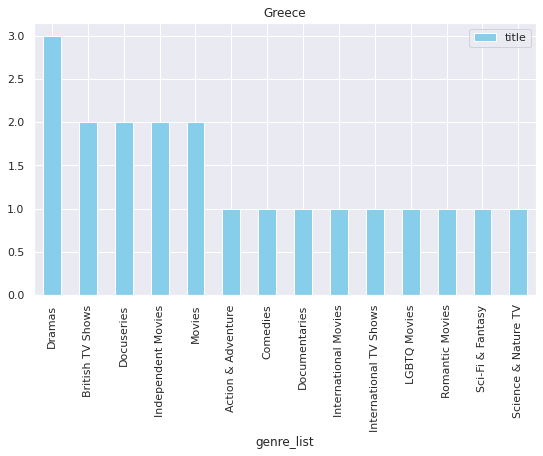

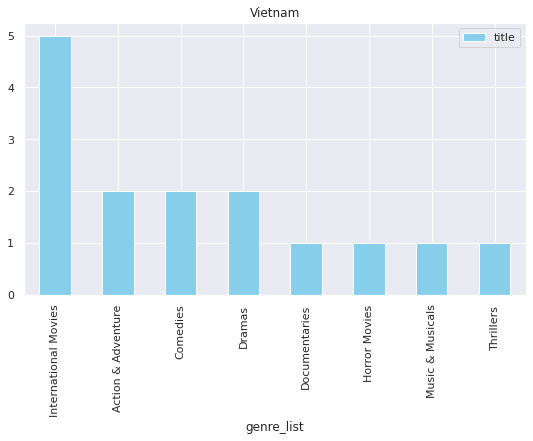

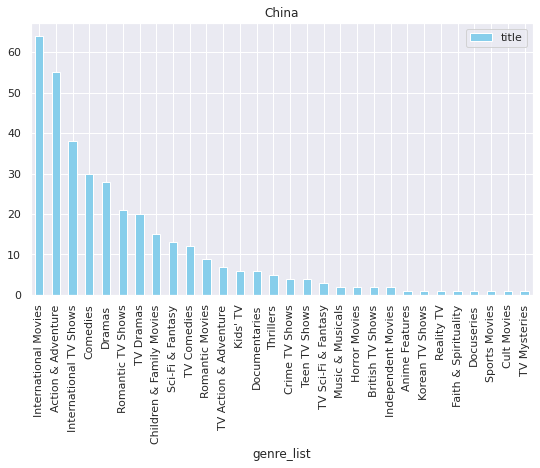

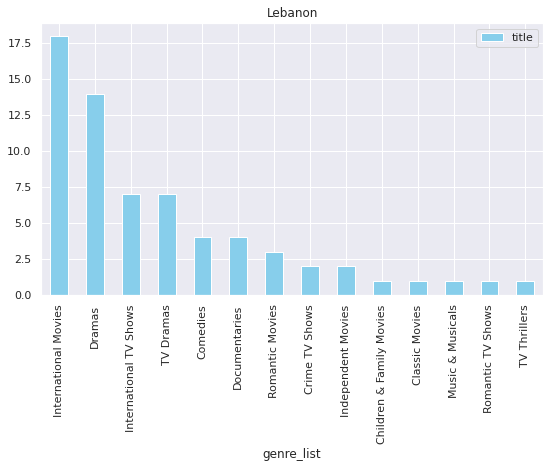

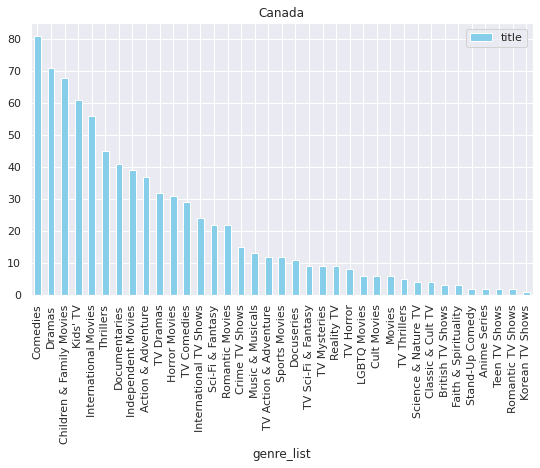

...

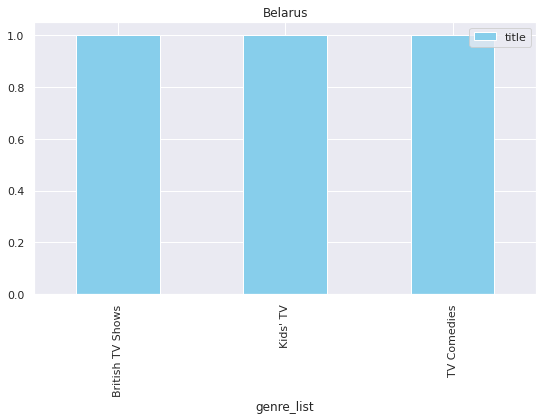

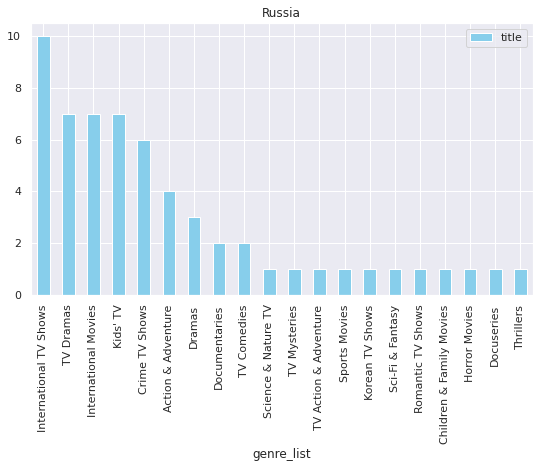

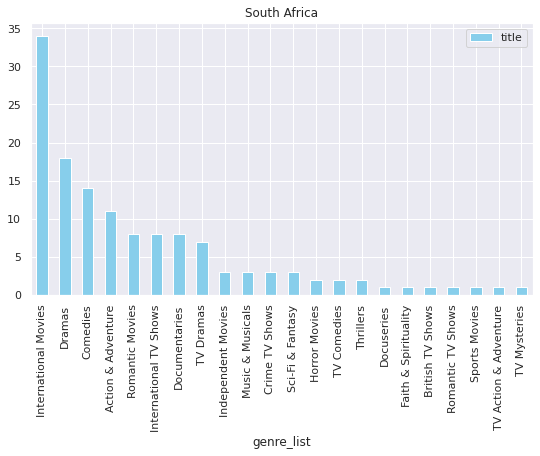

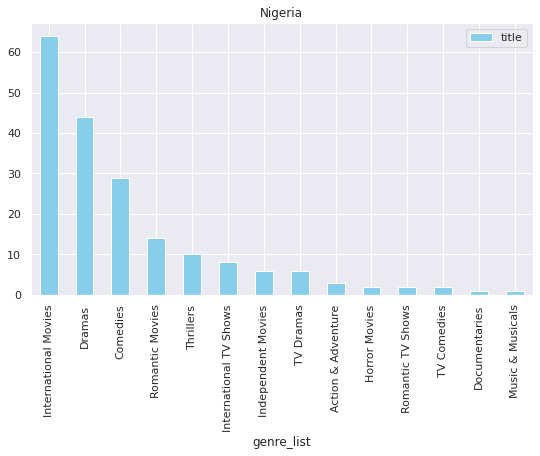

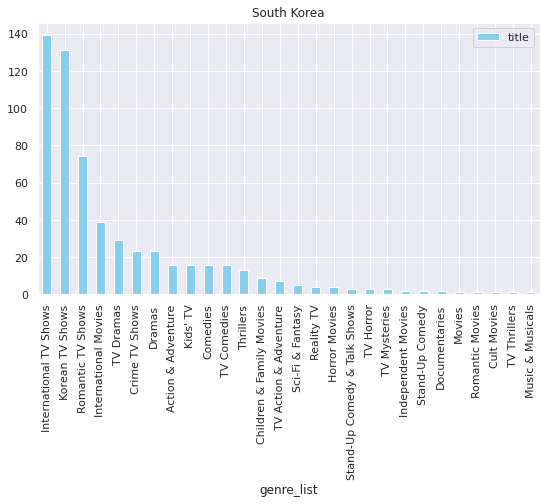

In [65]:
rating_country_df = get_genre_country_trends(df)

### Word Cloud for countries like US, India, UK, France, Canada etc.

In [66]:
def get_word_clouds(rating_country_df):
  country_list_ = ["United States", "India", "United Kingdom", "France", "Canada"]
  from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
  for each in country_list_:
    plt.rcParams['figure.figsize'] = (10, 10)
    wordcloud = WordCloud(stopwords=STOPWORDS,background_color = 'white', width = 1000,  height = 500, max_words = 121).generate(' '.join(rating_country_df[rating_country_df["country_list"]==each]['genre_list']))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(f'Most popular genres for {each}',fontsize = 30)
    plt.show()

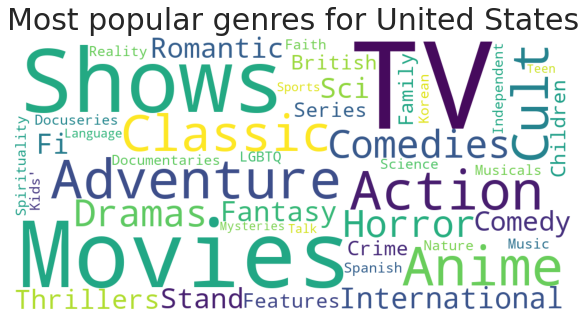

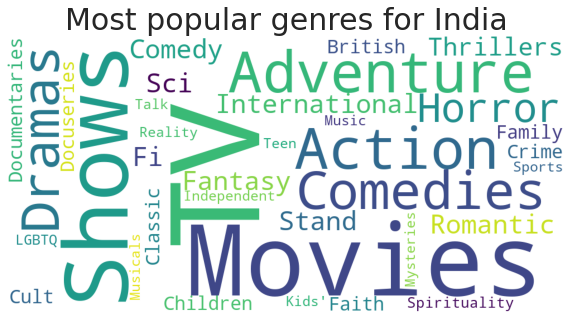

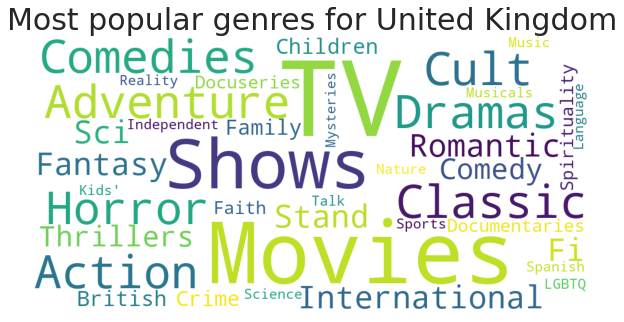

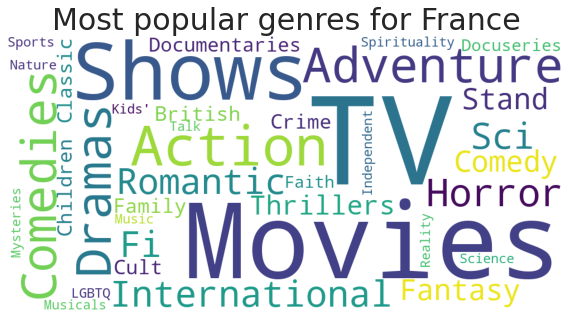

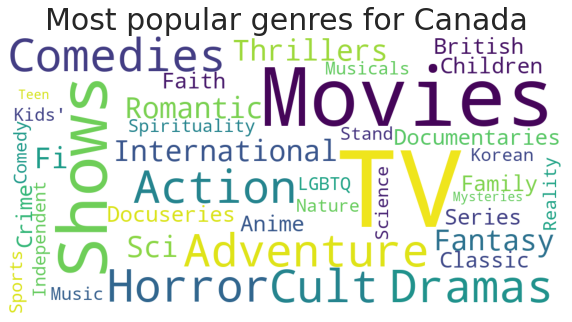

In [67]:
get_word_clouds(rating_country_df)

#Plotting country wise preferred rating for all countries

In [68]:
#getting country wise rating trend
def get_country_ratings_trends(df):
  def explode_country(country):
    try:
        return country.split(", ")
    except:
        return ""
  df['country_list'] = df.apply(lambda x: explode_country(x['country']),axis=1)
  df = df.explode('country_list')
  grouped_df_ = df.groupby(['country_list','rating']).agg({'title':'count'})
  grouped_df = grouped_df_.reset_index()
  grouped_df['country_list'].values
  grouped_df = grouped_df[grouped_df.country_list != '']
  rating_country_df = grouped_df.reset_index().drop("index", axis=1)
  list_of_countries = list(set(list(rating_country_df['country_list'].values)))
  for each in list_of_countries:
    rating_country_df[rating_country_df['country_list'] == each].sort_values("title",ascending=False).plot.bar(x = "rating", y="title", color="khaki", rot=45, figsize=(5,5))
    plt.title(f"{each}")

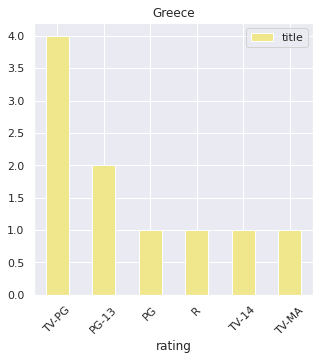

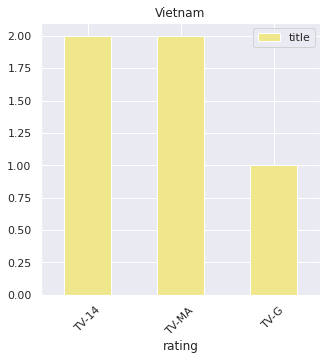

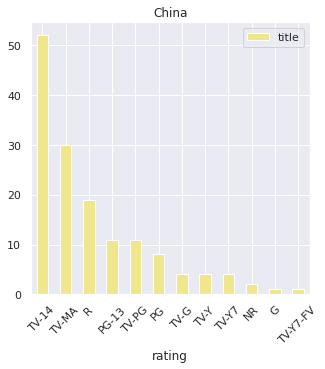

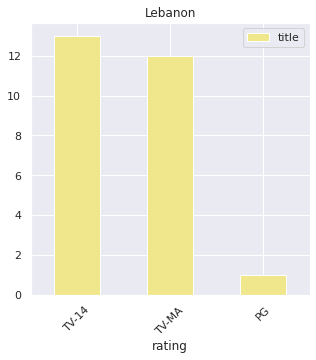

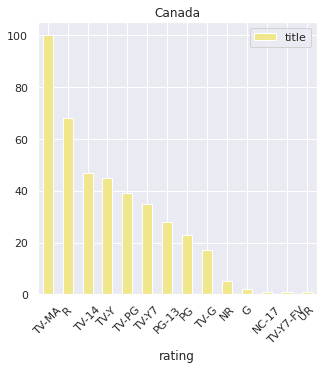

...

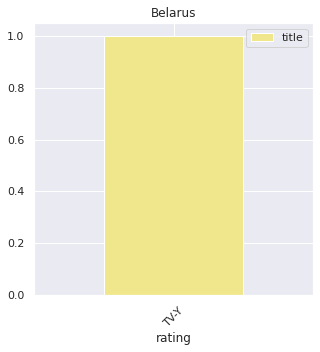

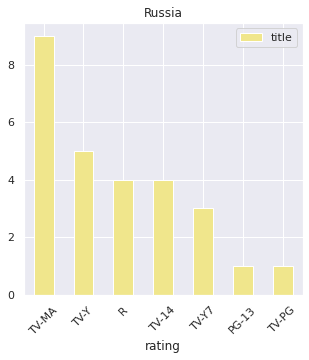

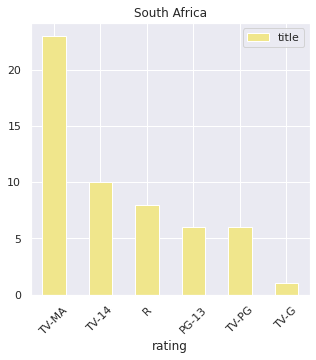

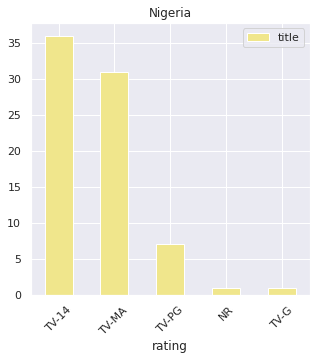

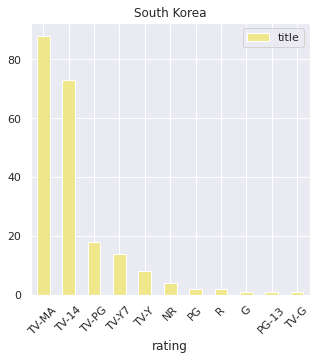

In [69]:
 get_country_ratings_trends(df)

#Plotting country wise preferred 'type' for all countries

In [70]:
#get all country type preference
def get_country_type_trends(df):
  def explode_country(country):
    try:
        return country.split(", ")
    except:
        return ""
  df['country_list'] = df.apply(lambda x: explode_country(x['country']),axis=1)
  df = df.explode('country_list')
  grouped_df_ = df.groupby(['country_list','type']).agg({'title':'count'})
  grouped_df = grouped_df_.reset_index()
  grouped_df['country_list'].values
  grouped_df = grouped_df[grouped_df.country_list != '']
  rating_country_df = grouped_df.reset_index().drop("index", axis=1)
  list_of_countries = list(set(list(rating_country_df['country_list'].values)))
  for each in list_of_countries:
    rating_country_df[rating_country_df['country_list'] == each].sort_values("title",ascending=False).plot.bar(x = "type", y="title", color="slateblue", rot=45, figsize=(5,5))
    plt.title(f"{each}")

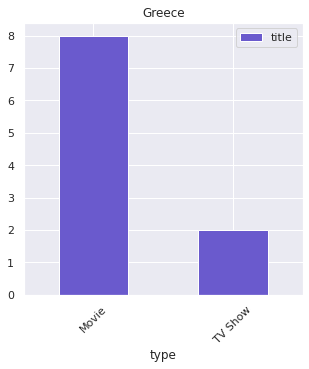

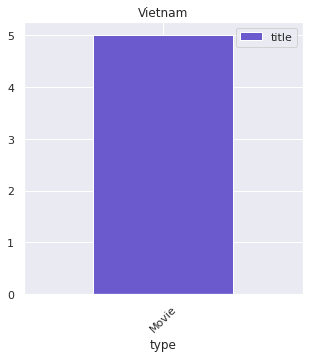

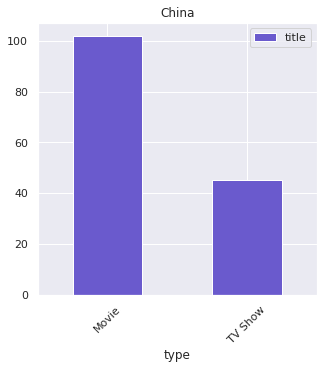

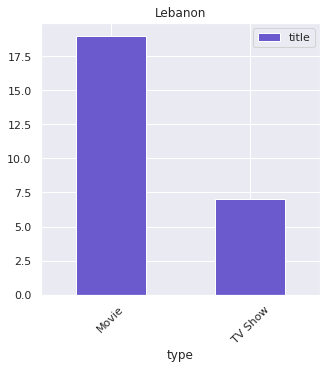

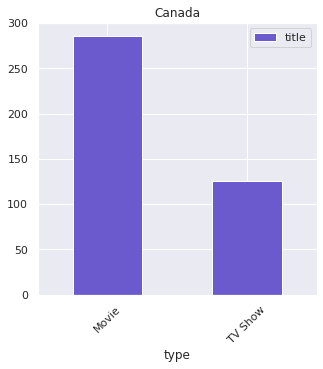

...

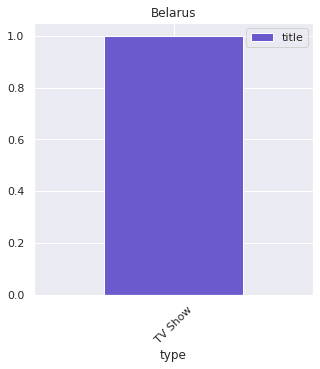

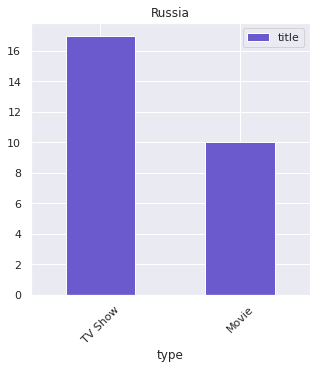

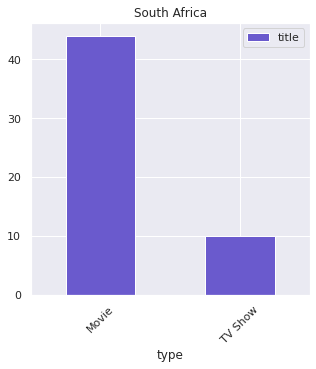

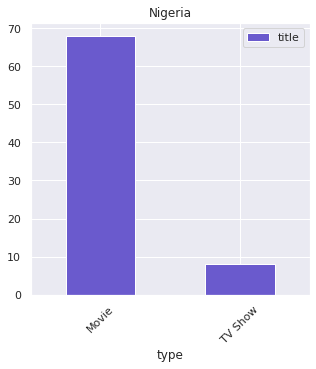

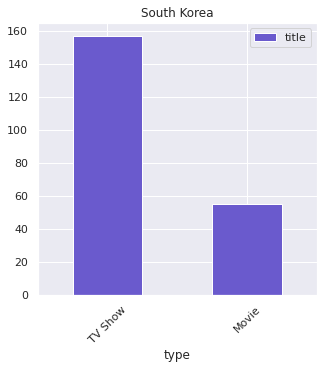

In [71]:
get_country_type_trends(df)

# Word Clouds Specific for Countries

# 1. Titles from different Countries

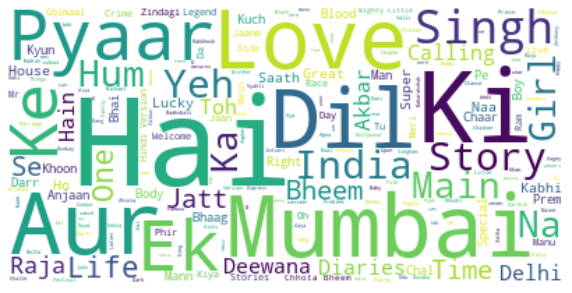

In [72]:
func_select_Category('India','country','title')

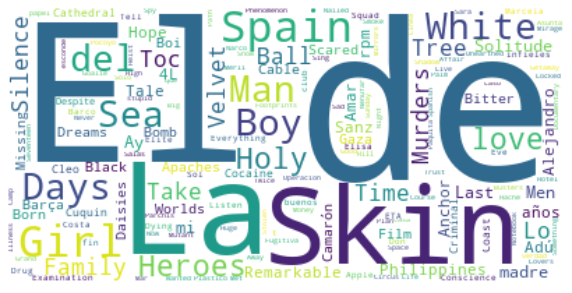

In [73]:
func_select_Category('Spain','country','title')

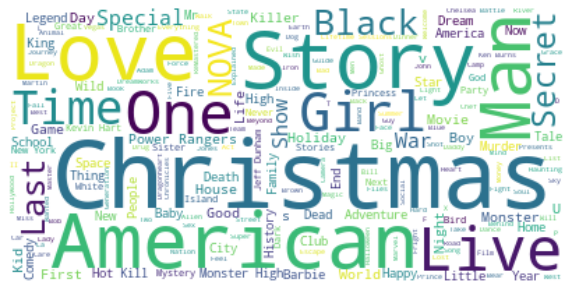

In [74]:
func_select_Category('United States','country','title')

# 2. 1. Description from different Countries

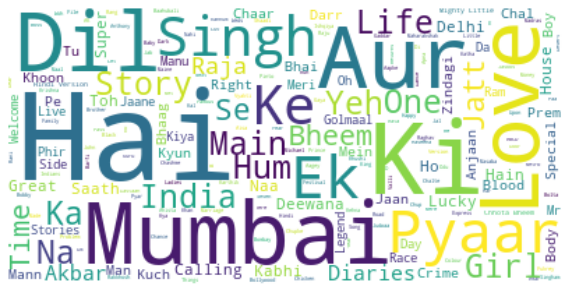

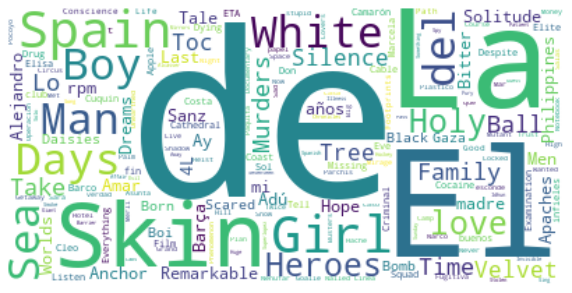

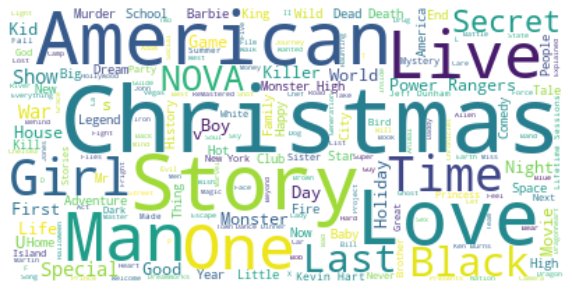

In [75]:
for i in ['India','Spain','United States']:
  func_select_Category(i,'country','title')

# 3. Director from different Countries

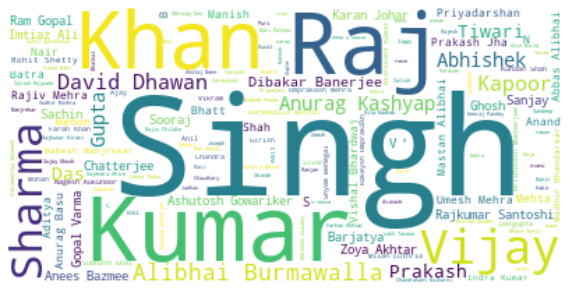

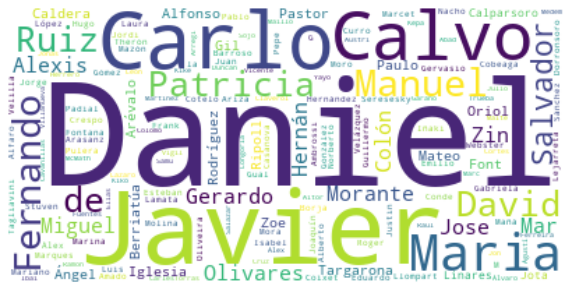

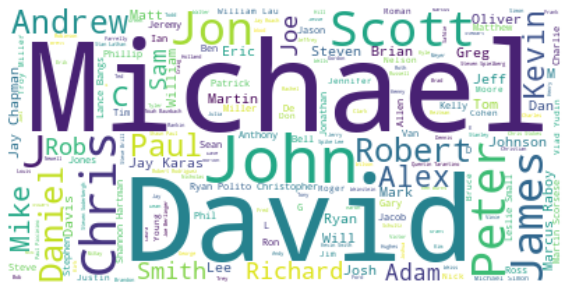

In [76]:
for i in ['India','Spain','United States']:
  func_select_Category(i,'country','director')

# 4. Cast from different Countries

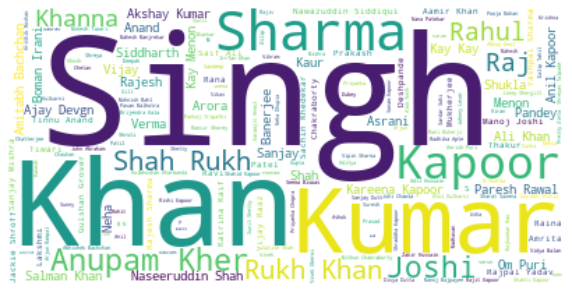

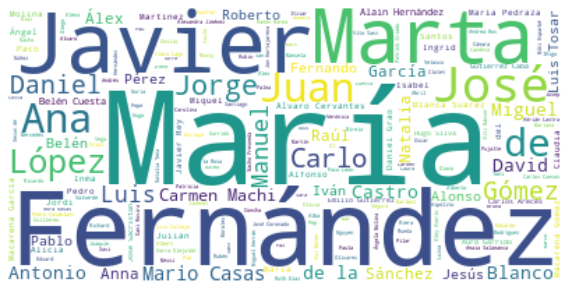

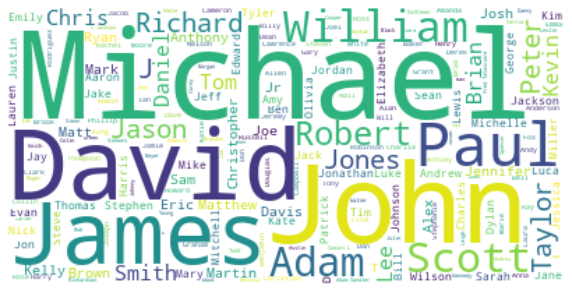

In [77]:
for i in ['India','Spain','United States']:
  func_select_Category(i,'country','cast')

# Better visualisation for Country Trends Using Plotly

In [78]:
#necessary imports for plotly and map
import pandas as pd
import numpy as np
import os
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.subplots import make_subplots

In [79]:
# all country df
all_countries = df.groupby(['country','type']).count()['show_id'].reset_index()
all_countries.head()

,country,type,show_id
0,Argentina,Movie,34
1,Argentina,TV Show,16
2,"Argentina, Brazil, France, Poland, Germany, De...",Movie,1
3,"Argentina, Chile",Movie,1
4,"Argentina, Chile, Peru",Movie,1


In [80]:
#country wise content for top countries
country_count = {}
for i in range(len(all_countries)):
    l = all_countries['country'][i].split(', ')
    for x in l:
        x = re.sub('[^A-Za-z0-9 ]+', '', x)
        if x not in country_count.keys():
            country_count[x] = all_countries['show_id'][i]
        else:
            country_count[x] += all_countries['show_id'][i]
country_df = pd.DataFrame(list(zip(country_count.keys(), country_count.values())), columns =['country', 'count']) 

d = country_df.sort_values(by=['count'], ascending=False).head(10)
# .plot.bar(x='country',y='count',edgecolor='black')
fig = px.bar(d, x='country',y='count')
fig.update_traces(marker_color='#221F1F', marker_line_color='#E50914',
                  marker_line_width=2, opacity=1)
fig.update_layout(title='Content produced country wise')
fig.show()
top_30 = country_df.sort_values(by=['count'], ascending=False)['country'].head(30)

# Total Content per Country on World Map Visualisation ( Hover over to see content count on each country)

In [81]:
#total content per country
sns.set_theme()
trace = go.Choropleth(
            locations = list(country_count.keys()),
            locationmode='country names',
            z = list(country_count.values()),
            text = country_df['country'],
#             autocolorscale =True,
            reversescale = False,
            zauto = True,
            colorscale = 'RdBu',
            marker = dict(
                line = dict(
                    color = 'rgb(0,0,0)',
                    width = 0.5)
            ),
            colorbar = dict(
                title = 'Total Content',
                tickprefix = '')
        )

data = [trace]
layout = go.Layout(
    title = 'Total content per country',
    geo = dict(
        showframe = True,
        showlakes = False,
        showcoastlines = True,
#         projection = dict(
#             type = 'natural earth'
#         )
    )
)

fig = go.Figure(data=data, layout=layout)
fig.show()

# 3. 3. Is Netflix has increasingly focusing on TV rather than movies in recent years.?

#Hyp : In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

In [82]:
#subsetting data for visualisation
d1 = df[df["type"] == "TV Show"]
d2 = df[df["type"] == "Movie"]

col = "year_added"

vc1 = d1[col].value_counts().reset_index()
vc1 = vc1.rename(columns = {col : "count", "index" : col})
vc1['percent'] = vc1['count'].apply(lambda x : 100*x/sum(vc1['count']))
vc1 = vc1.sort_values(col)

vc2 = d2[col].value_counts().reset_index()
vc2 = vc2.rename(columns = {col : "count", "index" : col})
vc2['percent'] = vc2['count'].apply(lambda x : 100*x/sum(vc2['count']))
vc2 = vc2.sort_values(col)

trace1 = go.Scatter(
                    x=vc1[col], 
                    y=vc1["count"], 
                    name="TV Shows", 
                    marker=dict(color = 'rgb(249, 6, 6)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))

trace2 = go.Scatter(
                    x=vc2[col], 
                    y=vc2["count"], 
                    name="Movies", 
                    marker= dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)))
layout = go.Layout(hovermode= 'closest', title = 'Content added over the years' , xaxis = dict(title = 'Year'), yaxis = dict(title = 'Count'),template= "plotly_dark")
fig = go.Figure(data = [trace1, trace2], layout=layout)
fig.show(renderer='colab')

#Movies added

In [83]:
df['type'].unique()

array(['TV Show', 'Movie'], dtype=object)

In [84]:
#movies added over year
movies_added_year_wise_df = df[(df['type']=="Movie")].groupby(['year_added']).agg({'show_id':'count'})
movies_added_year_wise_df.reset_index(inplace=True)
movies_added_year_wise_df

,year_added,show_id
0,2008.0,1
1,2009.0,2
2,2010.0,1
3,2011.0,13
4,2012.0,3
5,2013.0,6
6,2014.0,19
7,2015.0,58
8,2016.0,258
9,2017.0,864


## Plot for movies added over years alone!

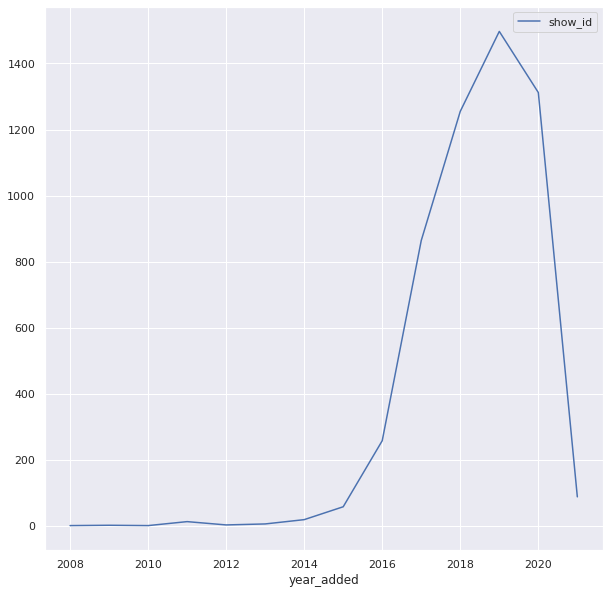

In [85]:
movies_added_year_wise_df.plot.line(x="year_added", y="show_id")

#Hyp : In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

#TV SHOWS

TV shows around 2010:

In [86]:
# year added v/s count
shows_added_year_wise_df = df[df['type']=="TV Show"].groupby(['year_added']).agg({'show_id':'count'})
shows_added_year_wise_df.reset_index(inplace=True)
shows_added_year_wise_df


,year_added,show_id
0,2008.0,1
1,2013.0,5
2,2014.0,6
3,2015.0,30
4,2016.0,185
5,2017.0,361
6,2018.0,430
7,2019.0,656
8,2020.0,697
9,2021.0,29


In [87]:
shows_added_year_wise_df[(shows_added_year_wise_df["year_added"] >= 2010) & (shows_added_year_wise_df["year_added"] <= 2013)]['show_id']
# int(shows_added_year_wise_df[(shows_added_year_wise_df["Year_of_adding"] >= 2010) & (shows_added_year_wise_df["Year_of_adding"] <= 2013)]['show_id'])
# result[(result['var']>0.25) | (result['var']<-0.25)]

1    5
Name: show_id, dtype: int64

TV shows added till 2018:

In [88]:
shows_added_year_wise_df[shows_added_year_wise_df["year_added"] <= 2018]["show_id"].sum()

1018

percentage by which the tv shows have increased:

In [89]:
factor = (shows_added_year_wise_df[shows_added_year_wise_df["year_added"] <= 2018]["show_id"].sum())/(int(shows_added_year_wise_df[(shows_added_year_wise_df["year_added"] >= 2010) & (shows_added_year_wise_df["year_added"] <= 2013)]['show_id']))

In [90]:
print(f"Number of TV shows increased by : {factor} times since 2010")


Number of TV shows increased by : 203.6 times since 2010


In [91]:
factor = (shows_added_year_wise_df[shows_added_year_wise_df["year_added"] == 2018]["show_id"].sum())/(int(shows_added_year_wise_df[(shows_added_year_wise_df["year_added"] >= 2010) & (shows_added_year_wise_df["year_added"] <= 2013)]['show_id']))

In [92]:
print(f"Number of TV shows increased by : {factor} times in 2018 as compared to 2010")

Number of TV shows increased by : 86.0 times in 2018 as compared to 2010


#According to the given dataset, the number of TV shows have definitely increased by more than 3 times, not just 3 times

#MOVIES

In [93]:
movies_added_year_wise_df

,year_added,show_id
0,2008.0,1
1,2009.0,2
2,2010.0,1
3,2011.0,13
4,2012.0,3
5,2013.0,6
6,2014.0,19
7,2015.0,58
8,2016.0,258
9,2017.0,864


23 movies added between 2010 and 2013

In [94]:
movies_added_year_wise_df[(movies_added_year_wise_df["year_added"] >= 2010) & (movies_added_year_wise_df["year_added"] <= 2013)]['show_id'].sum()

23

Movies added till 2018:

In [95]:
movies_added_year_wise_df[movies_added_year_wise_df["year_added"] <= 2018]["show_id"].sum()

2480

Movies added in 2018:

In [96]:
movies_added_year_wise_df[movies_added_year_wise_df["year_added"] == 2018]["show_id"].sum()

1255

factor by which movies have increased:

In [97]:
factor_2018 = (movies_added_year_wise_df[movies_added_year_wise_df["year_added"] == 2018]["show_id"].sum())/(movies_added_year_wise_df[(movies_added_year_wise_df["year_added"] >= 2010) & (movies_added_year_wise_df["year_added"] <= 2013)]['show_id'].sum())
factor_till2018 = (movies_added_year_wise_df[movies_added_year_wise_df["year_added"] <= 2018]["show_id"].sum())/(movies_added_year_wise_df[(movies_added_year_wise_df["year_added"] >= 2010) & (movies_added_year_wise_df["year_added"] <= 2013)]['show_id'].sum())

In [98]:
factor_2018

54.56521739130435

In [99]:
factor_till2018

107.82608695652173

We can see that number of movies addition have increased, not the other way round

In [100]:
df.shape

(7787, 15)

# 4. Text Based Clustering


In [101]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7787 non-null   object        
 1   type          7787 non-null   object        
 2   title         7787 non-null   object        
 3   director      7787 non-null   object        
 4   cast          7787 non-null   object        
 5   country       7280 non-null   object        
 6   date_added    7777 non-null   datetime64[ns]
 7   release_year  7787 non-null   int64         
 8   rating        7780 non-null   object        
 9   duration      7787 non-null   object        
 10  listed_in     7787 non-null   object        
 11  description   7787 non-null   object        
 12  year_added    7777 non-null   float64       
 13  month_added   7777 non-null   float64       
 14  country_list  7787 non-null   object        
dtypes: datetime64[ns](1), float64(2), int6

In [102]:
#fill missing with empty string
df['country'] = df['country'].fillna('')

In [103]:
#appending all text column to single text column to work with
df['filtered'] = df['description'] + ' ' + df['rating'] + ' '+ df['country']+ ' ' + df['cast']


In [104]:
df['filtered'][0]

'In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor. TV-MA Brazil João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi'

In [105]:
df

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,year_added,month_added,country_list,filtered
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020.0,8.0,[Brazil],In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016.0,12.0,[Mexico],After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018.0,12.0,[Singapore],"When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017.0,11.0,[United States],"In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020.0,1.0,[United States],A brilliant group of students become card-coun...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...",2020-10-19,2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,2020.0,10.0,"[Sweden, Czech Republic, United Kingdom, Denma...",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,2019-03-02,2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,2019.0,3.0,[India],A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,,Nasty C,,2020-09-25,2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",2020.0,9.0,,"In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,,"Adriano Zumbo, Rachel Khoo",Australia,2020-10-31,2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,2020.0,10.0,[Australia],Dessert wizard Adriano Zumbo looks for the nex...


### Checking word length for different column

In [106]:
#descri len
descp_len  = [len(x) for x in df['description']]
descp_len = np.array(descp_len)


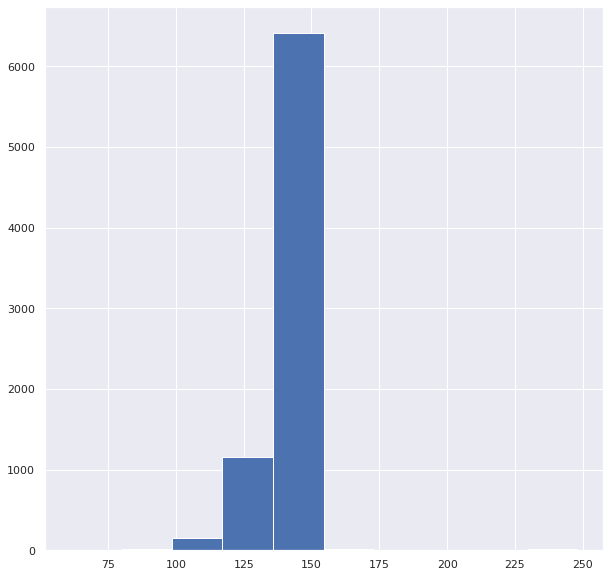

In [107]:
plt.hist(descp_len)
plt.show()

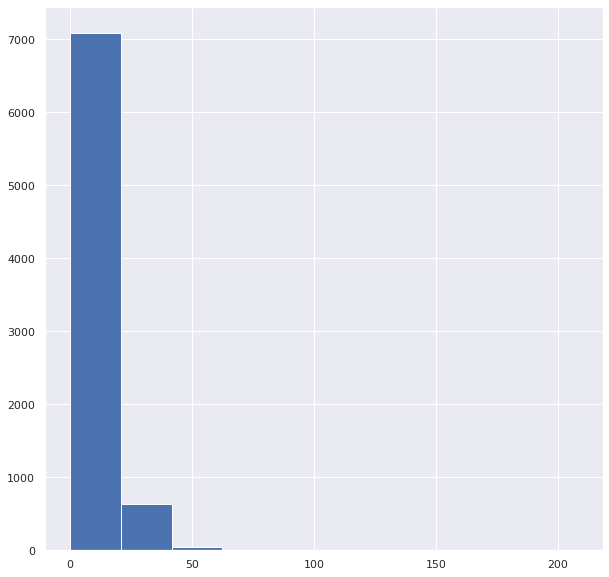

In [108]:
# director length
dir_len  = [len(x) for x in df['director']]
dir_len = np.array(dir_len)
plt.hist(dir_len)
plt.show()

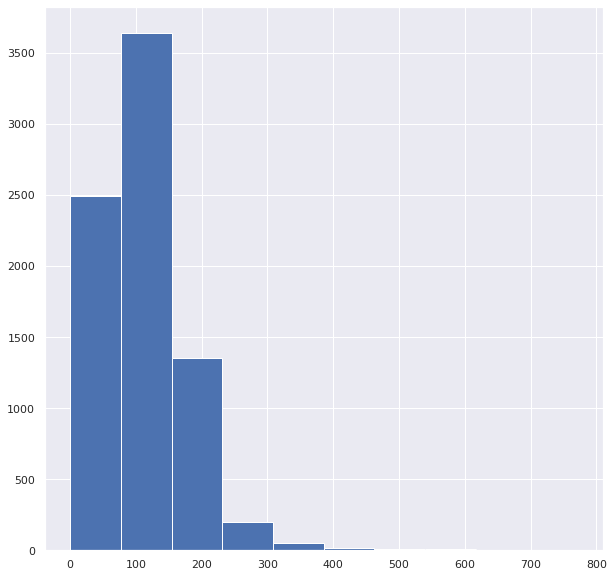

In [109]:
#Cast length
cast_len  = [len(x) for x in df['cast']]
cast_len = np.array(cast_len)
plt.hist(cast_len)
plt.show()

In [110]:
df['filtered']

0       In a future where the elite inhabit an island ...
1       After a devastating earthquake hits Mexico Cit...
2       When an army recruit is found dead, his fellow...
3       In a postapocalyptic world, rag-doll robots hi...
4       A brilliant group of students become card-coun...
                              ...                        
7782    When Lebanon's Civil War deprives Zozo of his ...
7783    A scrappy but poor boy worms his way into a ty...
7784    In this documentary, South African rapper Nast...
7785    Dessert wizard Adriano Zumbo looks for the nex...
7786    This documentary delves into the mystique behi...
Name: filtered, Length: 7787, dtype: object

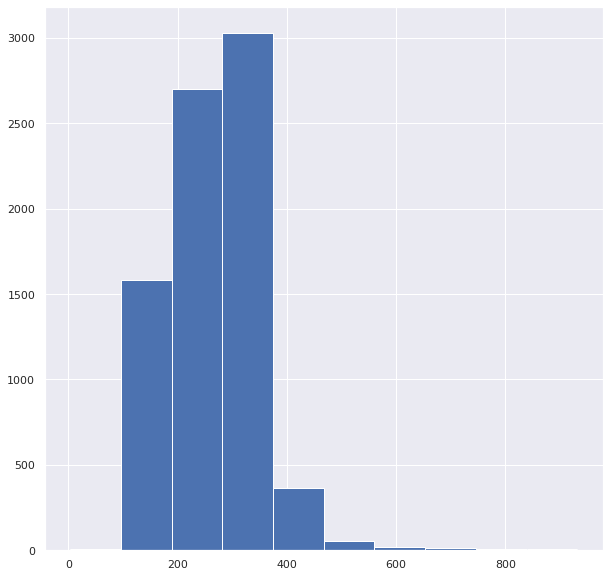

In [111]:
#final filtered column length
fil_len  = [len(str(x)) for x in df['filtered']]
fil_len = np.array(fil_len)
plt.hist(fil_len)
plt.show()

## Text Preprocessing!

In [112]:
#text cleaning
import re
def cleaned(x):
    return re.sub(r"[^a-zA-Z ]","",str(x))
df['filtered'] = df['filtered'].apply(cleaned)

In [113]:
# to lower
df['filtered' ]= df['filtered'].str.lower()

In [114]:
#necessary import for nlp
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.snowball import SnowballStemmer
nltk.download('punkt')



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [115]:

import nltk
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
 
# Create WordNetLemmatizer object
wnl = WordNetLemmatizer()

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [116]:
# #stemming
# stemmer = SnowballStemmer('english')
stop_words = set(stopwords.words('english'))

In [117]:
stop_words

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

In [118]:
df=df.dropna()

In [119]:
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [120]:
import nltk

w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()

def lemmatize_text(text):
    return [lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(str(text))]

df['filtered_new'] = df.filtered.apply(lemmatize_text)

In [121]:
df['filtered_new']

0       [in, a, future, where, the, elite, inhabit, an...
1       [after, a, devastating, earthquake, hit, mexic...
2       [when, an, army, recruit, is, found, dead, his...
3       [in, a, postapocalyptic, world, ragdoll, robot...
4       [a, brilliant, group, of, student, become, car...
                              ...                        
7782    [when, lebanon, civil, war, deprives, zozo, of...
7783    [a, scrappy, but, poor, boy, worm, his, way, i...
7784    [in, this, documentary, south, african, rapper...
7785    [dessert, wizard, adriano, zumbo, look, for, t...
7786    [this, documentary, delf, into, the, mystique,...
Name: filtered_new, Length: 7770, dtype: object

In [122]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

stop_words = stopwords.words('english')
def stow(lst):
  m=[]
  for i in lst:
    if i not in stop_words:
      m.append(i)
    else:
      pass
  return m


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [123]:
df['filtered_new']=df['filtered_new'].apply(stow)

In [124]:
df['filtered_new']

0       [future, elite, inhabit, island, paradise, far...
1       [devastating, earthquake, hit, mexico, city, t...
2       [army, recruit, found, dead, fellow, soldier, ...
3       [postapocalyptic, world, ragdoll, robot, hide,...
4       [brilliant, group, student, become, cardcounti...
                              ...                        
7782    [lebanon, civil, war, deprives, zozo, family, ...
7783    [scrappy, poor, boy, worm, way, tycoon, dysfun...
7784    [documentary, south, african, rapper, nasty, c...
7785    [dessert, wizard, adriano, zumbo, look, next, ...
7786    [documentary, delf, mystique, behind, bluesroc...
Name: filtered_new, Length: 7770, dtype: object

In [125]:
#join words fun
def join_words(x):
  return " ".join(x)

In [126]:
#final column
df['filtered_new'] = df['filtered_new'].apply(join_words)

In [127]:
df

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,year_added,month_added,country_list,filtered,filtered_new
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020.0,8.0,[Brazil],in a future where the elite inhabit an island ...,future elite inhabit island paradise far crowd...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016.0,12.0,[Mexico],after a devastating earthquake hits mexico cit...,devastating earthquake hit mexico city trapped...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018.0,12.0,[Singapore],when an army recruit is found dead his fellow ...,army recruit found dead fellow soldier forced ...
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017.0,11.0,[United States],in a postapocalyptic world ragdoll robots hide...,postapocalyptic world ragdoll robot hide fear ...
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020.0,1.0,[United States],a brilliant group of students become cardcount...,brilliant group student become cardcounting ex...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...",2020-10-19,2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,2020.0,10.0,"[Sweden, Czech Republic, United Kingdom, Denma...",when lebanons civil war deprives zozo of his f...,lebanon civil war deprives zozo family left gr...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,2019-03-02,2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,2019.0,3.0,[India],a scrappy but poor boy worms his way into a ty...,scrappy poor boy worm way tycoon dysfunctional...
7784,s7785,Movie,Zulu Man in Japan,,Nasty C,,2020-09-25,2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",2020.0,9.0,,in this documentary south african rapper nasty...,documentary south african rapper nasty c hit s...
7785,s7786,TV Show,Zumbo's Just Desserts,,"Adriano Zumbo, Rachel Khoo",Australia,2020-10-31,2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,2020.0,10.0,[Australia],dessert wizard adriano zumbo looks for the nex...,dessert wizard adriano zumbo look next willy w...


In [128]:
words = df.filtered_new

In [129]:
words

0       future elite inhabit island paradise far crowd...
1       devastating earthquake hit mexico city trapped...
2       army recruit found dead fellow soldier forced ...
3       postapocalyptic world ragdoll robot hide fear ...
4       brilliant group student become cardcounting ex...
                              ...                        
7782    lebanon civil war deprives zozo family left gr...
7783    scrappy poor boy worm way tycoon dysfunctional...
7784    documentary south african rapper nasty c hit s...
7785    dessert wizard adriano zumbo look next willy w...
7786    documentary delf mystique behind bluesrock tri...
Name: filtered_new, Length: 7770, dtype: object

##TFIDF Vectorization

In [130]:
#using tfidf
from sklearn.feature_extraction.text import TfidfVectorizer
t_vectorizer = TfidfVectorizer(ngram_range=(1, 3),max_df = 0.9,min_df = 1, max_features=15000)
X= t_vectorizer.fit_transform(words)

In [131]:
X

<7770x15000 sparse matrix of type '<class 'numpy.float64'>'
	with 240781 stored elements in Compressed Sparse Row format>

## PCA for Dimensionality Reduction

In [132]:
#PCA Code
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
# transformer = PCA()
# transformer.fit(X.toarray())

In [133]:
#choosing right dim from plot, this might take a while, for ready ans use n_components = 3000
from sklearn.decomposition import PCA
transformer = PCA(n_components=4000)
transformer.fit(X.toarray())
X_transformed = transformer.transform(X.toarray())
X_transformed.shape

(7770, 4000)

In [134]:
# vectorizing the test and train
X_vectorized = t_vectorizer.transform(words)


In [135]:
#applying pca
X= transformer.transform(X_vectorized.toarray())


In [136]:
X

array([[ 0.03434801, -0.00200318,  0.03431391, ...,  0.00725083,
        -0.00578143, -0.00845325],
       [ 0.02439128, -0.00906573,  0.04645037, ...,  0.00245639,
         0.00467433,  0.00893827],
       [ 0.03608978,  0.02584502, -0.01507959, ...,  0.00615792,
         0.01096636,  0.00425995],
       ...,
       [ 0.01911317,  0.04426284,  0.04410013, ...,  0.00163075,
         0.00535046,  0.00595544],
       [ 0.01962054, -0.01449442, -0.03412121, ..., -0.00343372,
         0.00260036,  0.00811724],
       [-0.17110614,  0.02519163, -0.00384064, ..., -0.00962913,
         0.00422129, -0.00706319]])

## **HC**

In [137]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch

In [138]:
from pylab import rcParams
rcParams['figure.figsize'] = 15, 10

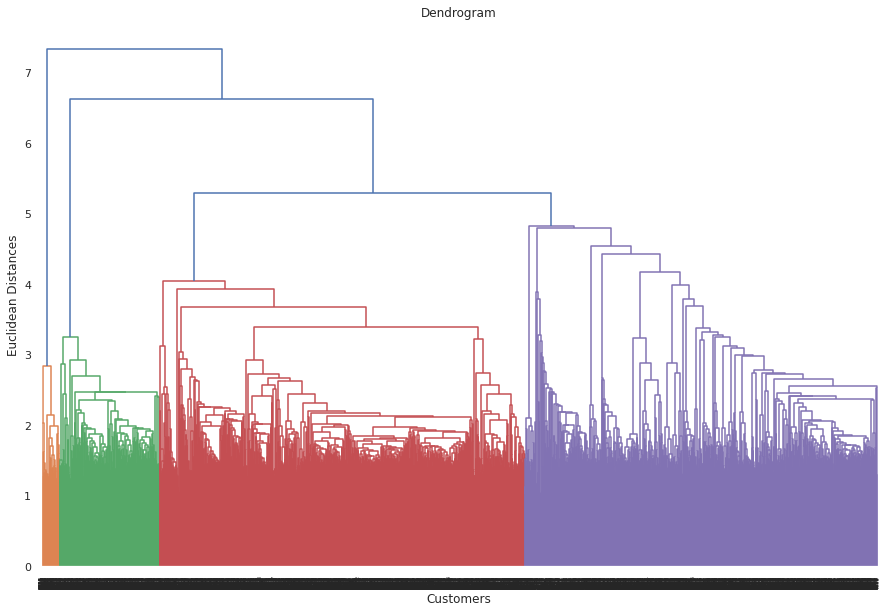

In [139]:
# Using the dendogram to find the optimal number of clusters
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(X, method = 'ward'))  
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean Distances')
plt.show() # find largest vertical distance we can make without crossing any other horizontal line

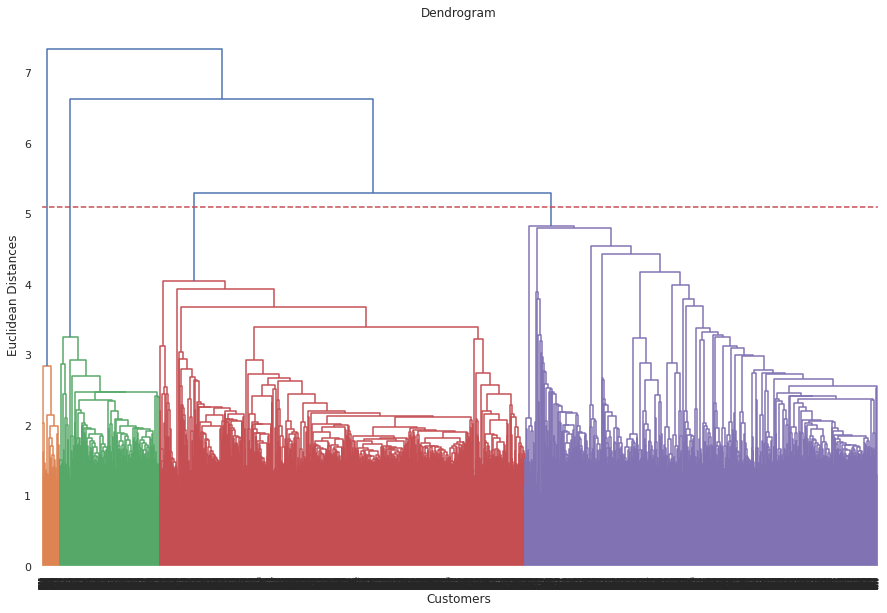

In [140]:
dendrogram = sch.dendrogram(sch.linkage(X, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean Distances')
plt.axhline(y=5.1, color='r', linestyle='--')
plt.show() # find largest vertical distance we can make without crossing any other horizontal line

In [150]:
# Fitting hierarchical clustering to the mall dataset
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 8, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(X)

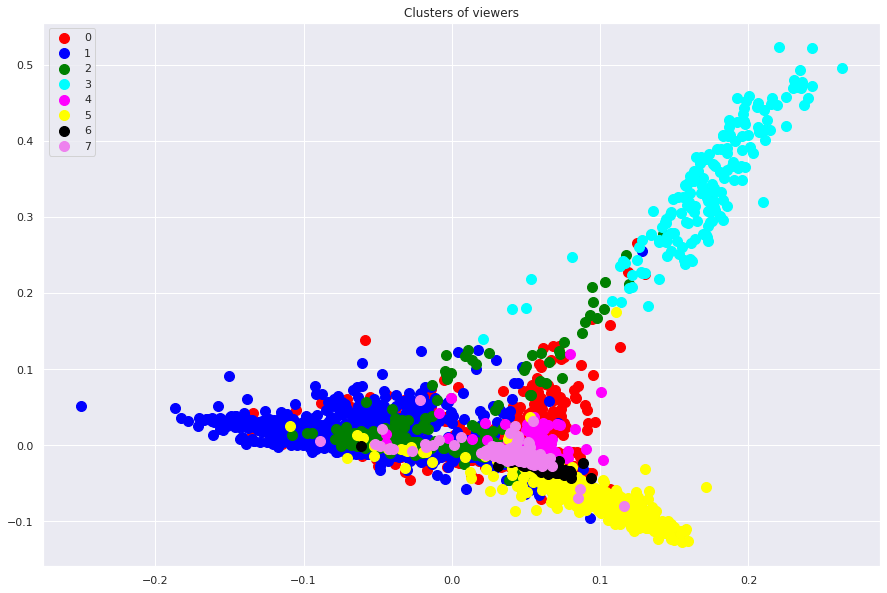

In [151]:
# Visualizing the clusters (two dimensions only)
plt.scatter(X[y_hc == 0, 0], X[y_hc == 0, 1], s = 100, c = 'red', label = '0')
plt.scatter(X[y_hc == 1, 0], X[y_hc == 1, 1], s = 100, c = 'blue', label = '1')
plt.scatter(X[y_hc == 2, 0], X[y_hc == 2, 1], s = 100, c = 'green', label = '2')
plt.scatter(X[y_hc == 3, 0], X[y_hc == 3, 1], s = 100, c = 'cyan', label = '3')
plt.scatter(X[y_hc == 4, 0], X[y_hc == 4, 1], s = 100, c = 'magenta', label = '4')
plt.scatter(X[y_hc == 5, 0], X[y_hc == 5, 1], s = 100, c = 'yellow', label = '5')
plt.scatter(X[y_hc == 6, 0], X[y_hc == 6, 1], s = 100, c = 'black', label = '6')
plt.scatter(X[y_hc == 7, 0], X[y_hc == 7, 1], s = 100, c = 'violet', label = '7')

plt.title('Clusters of viewers')
plt.xlabel('')
plt.ylabel('')
plt.legend()
plt.show()

In [152]:
np.unique(y_hc,return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 array([2360, 3395,  502,  176,   92,  927,  113,  205]))

In [153]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,year_added,month_added,country_list,filtered,filtered_new,cluster
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020.0,8.0,[Brazil],in a future where the elite inhabit an island ...,future elite inhabit island paradise far crowd...,0
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016.0,12.0,[Mexico],after a devastating earthquake hits mexico cit...,devastating earthquake hit mexico city trapped...,0
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018.0,12.0,[Singapore],when an army recruit is found dead his fellow ...,army recruit found dead fellow soldier forced ...,1
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017.0,11.0,[United States],in a postapocalyptic world ragdoll robots hide...,postapocalyptic world ragdoll robot hide fear ...,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020.0,1.0,[United States],a brilliant group of students become cardcount...,brilliant group student become cardcounting ex...,1


In [154]:
df['cluster']=hc.labels_

In [155]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,year_added,month_added,country_list,filtered,filtered_new,cluster
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020.0,8.0,[Brazil],in a future where the elite inhabit an island ...,future elite inhabit island paradise far crowd...,0
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016.0,12.0,[Mexico],after a devastating earthquake hits mexico cit...,devastating earthquake hit mexico city trapped...,0
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018.0,12.0,[Singapore],when an army recruit is found dead his fellow ...,army recruit found dead fellow soldier forced ...,1
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017.0,11.0,[United States],in a postapocalyptic world ragdoll robots hide...,postapocalyptic world ragdoll robot hide fear ...,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020.0,1.0,[United States],a brilliant group of students become cardcount...,brilliant group student become cardcounting ex...,1


In [156]:
#word cloud imports
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [157]:
#word cloud for user rating review
def func_select_Category(category_name,column_of_choice):
  df_word_cloud = df[['cluster',column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud['cluster']==category_name]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  # Create stopword list:
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
  # Display the generated image:
  # the matplotlib way:
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

## Word Cloud on Description col for different cluster

-------------- CLUSTER 0-------------- 

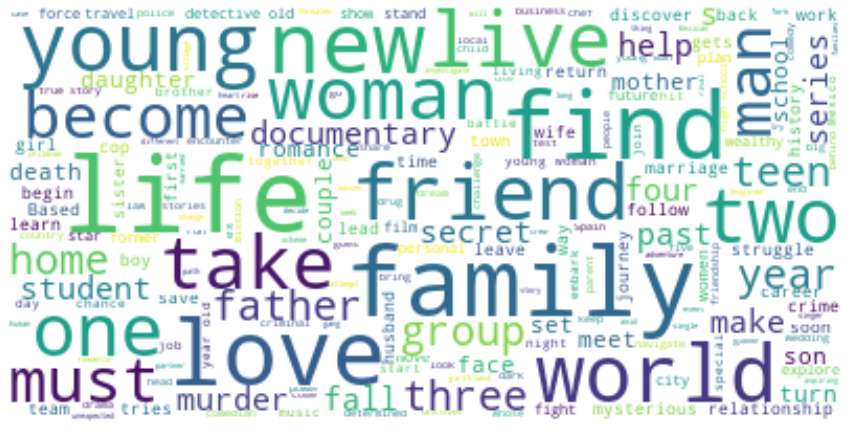

-------------- CLUSTER 1-------------- 

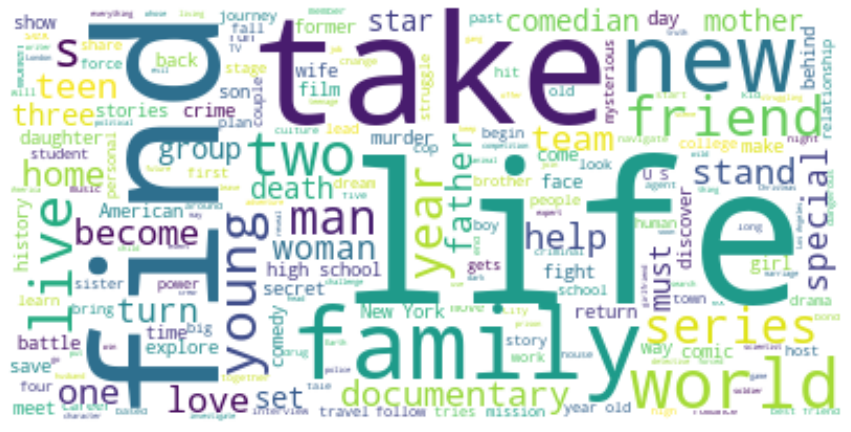

-------------- CLUSTER 2-------------- 

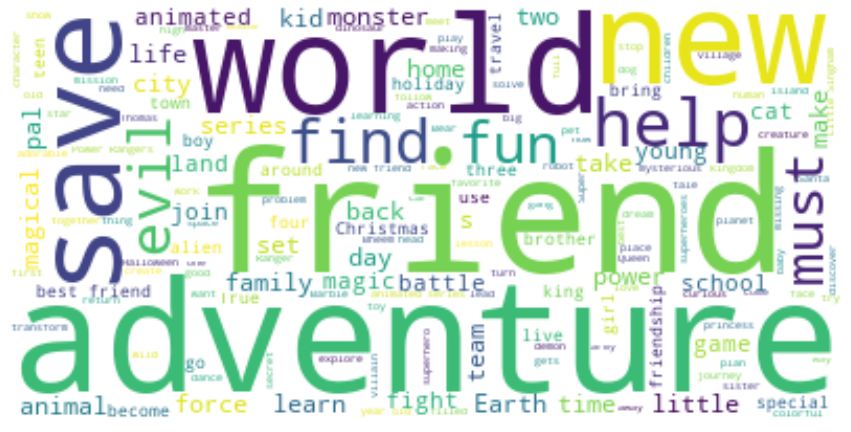

-------------- CLUSTER 3-------------- 

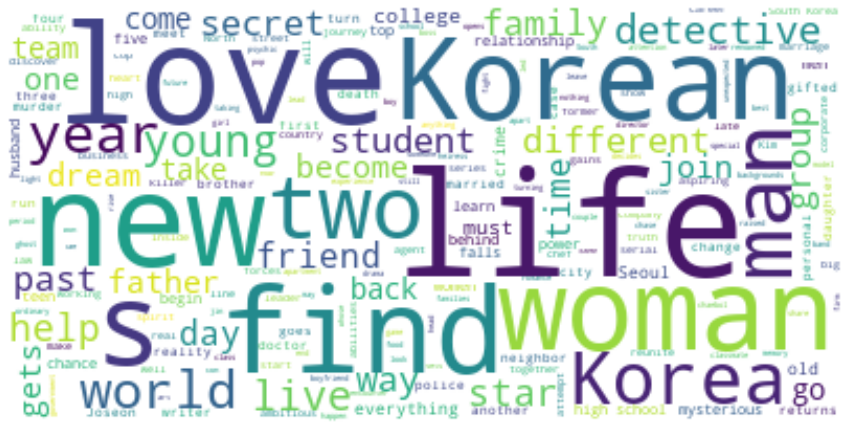

-------------- CLUSTER 4-------------- 

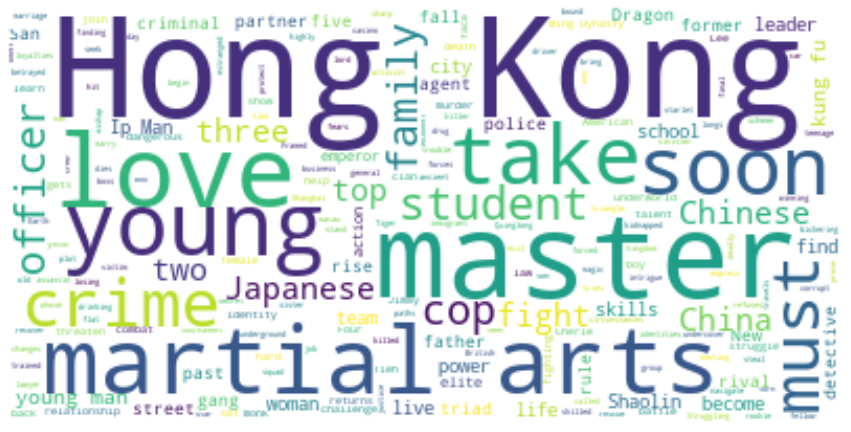

-------------- CLUSTER 5-------------- 

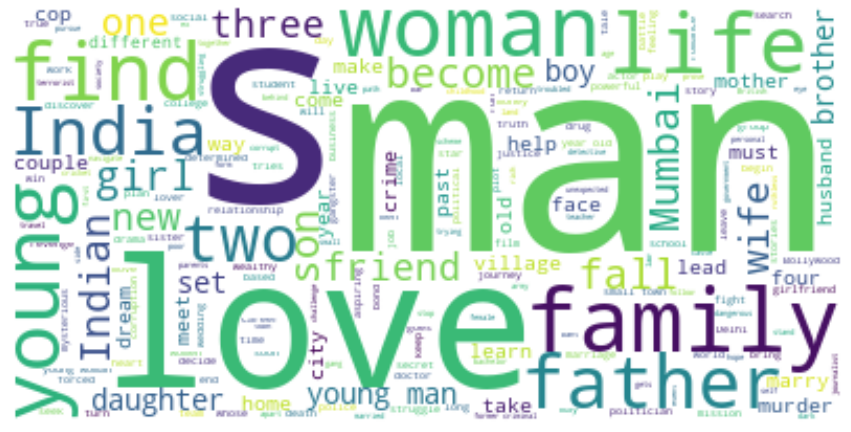

-------------- CLUSTER 6-------------- 

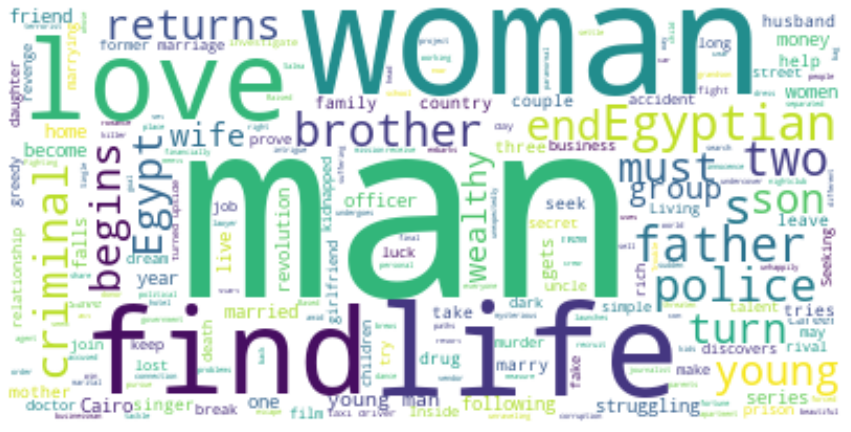

In [158]:
for i in range(7):
  print(f'-------------- CLUSTER {i}-------------- ',end='')
  func_select_Category(i,'description')

## Word Cloud on listed in col for different cluster

-------------- CLUSTER 0-------------- 

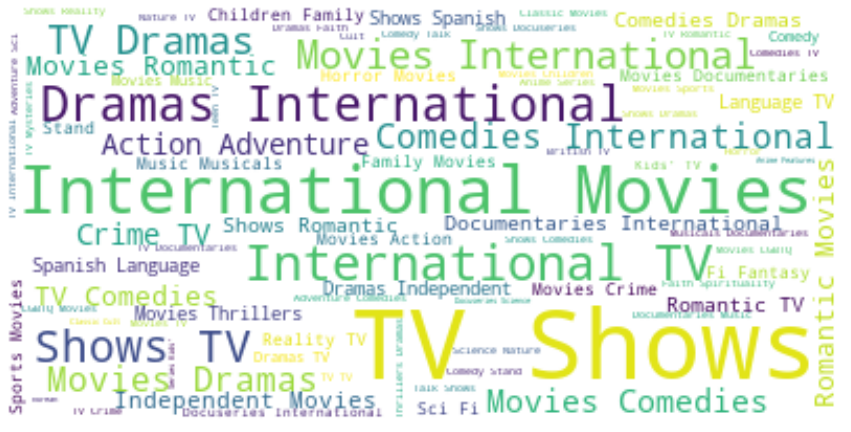

-------------- CLUSTER 1-------------- 

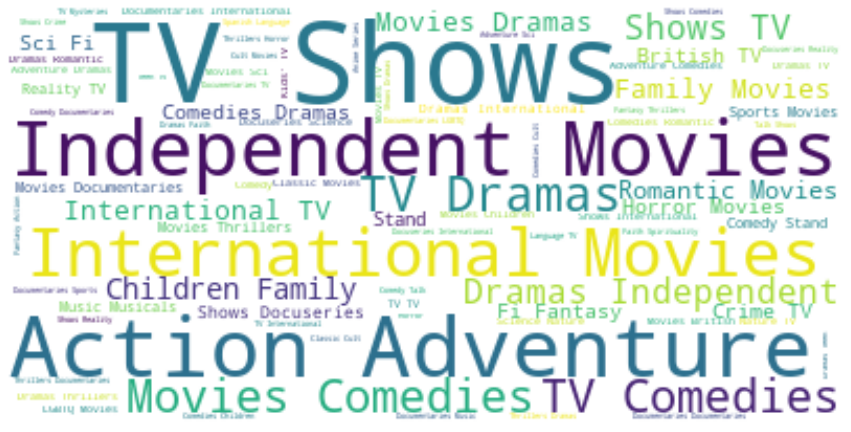

-------------- CLUSTER 2-------------- 

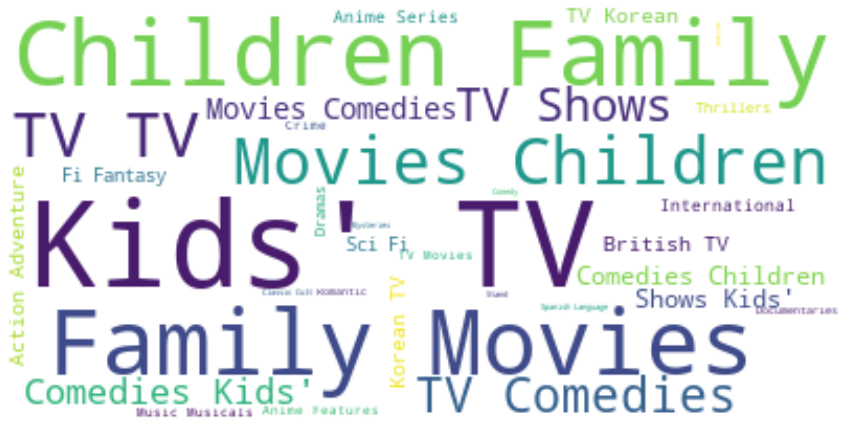

-------------- CLUSTER 3-------------- 

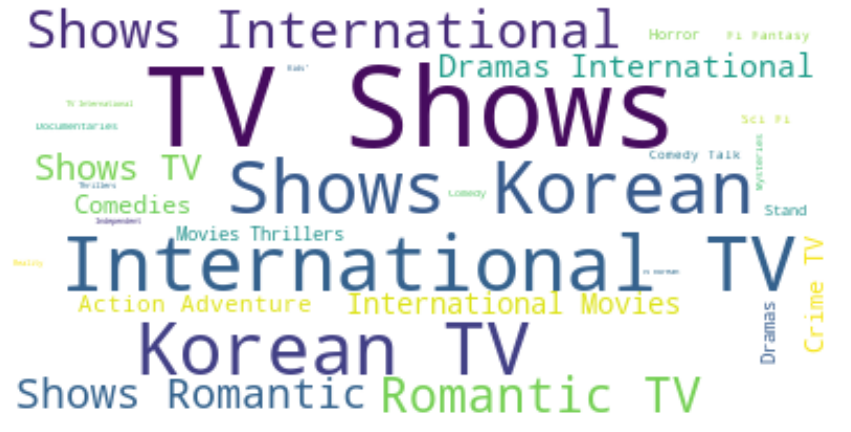

-------------- CLUSTER 4-------------- 

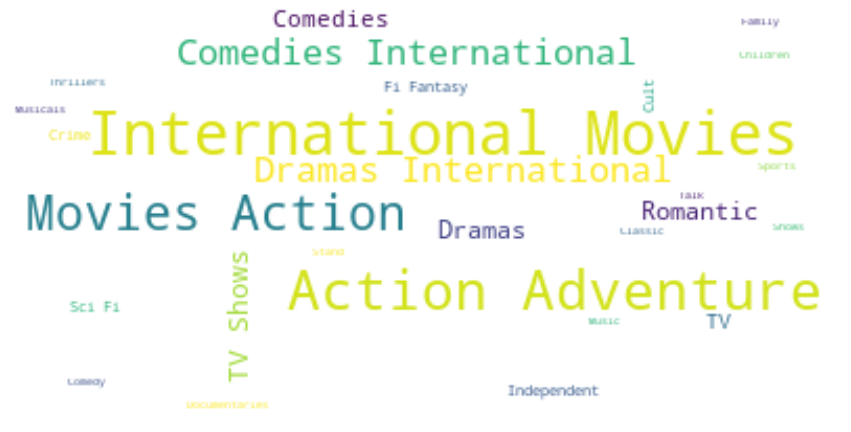

-------------- CLUSTER 5-------------- 

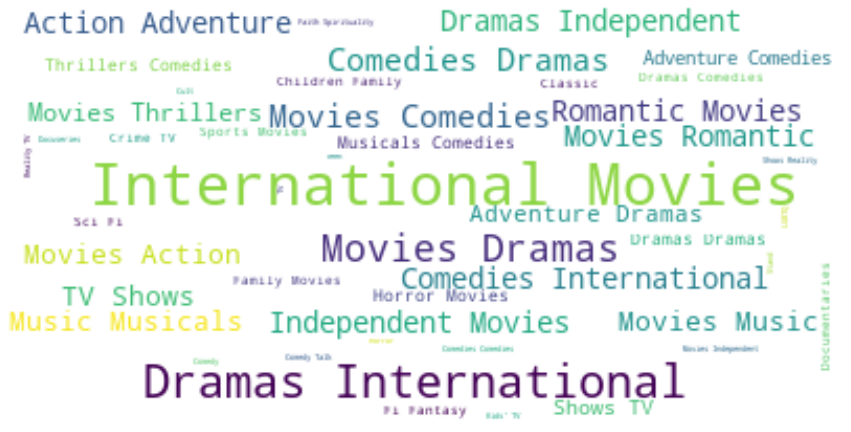

-------------- CLUSTER 6-------------- 

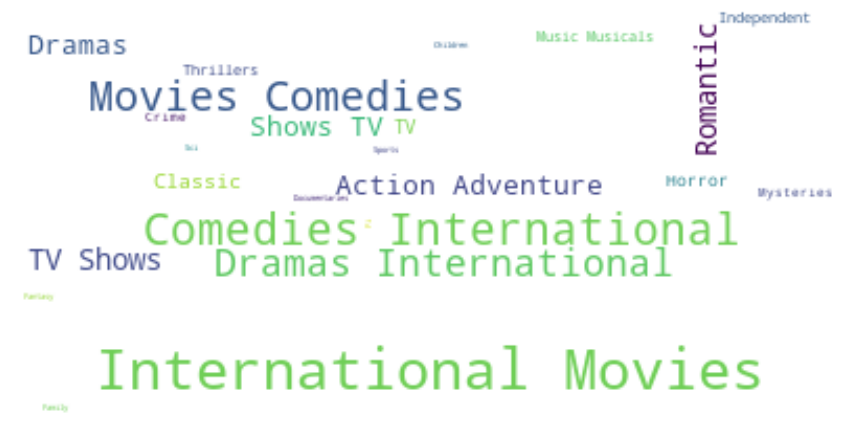

In [159]:
for i in range(7):
  print(f'-------------- CLUSTER {i}-------------- ',end='')
  func_select_Category(i,'listed_in')

# Better Visualisation for Clusters using Bokeh!!!

In [160]:
from sklearn.manifold import TSNE

x_embedded = TSNE(n_components=2).fit_transform(X)

x_embedded.shape

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(7770, 2)

In [161]:
#import for bokeh
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, CustomJS
from bokeh.palettes import Category20
from bokeh.transform import linear_cmap
from bokeh.io import output_file, show
from bokeh.transform import transform
from bokeh.io import output_notebook
from bokeh.plotting import figure
from bokeh.layouts import column
from bokeh.models import RadioButtonGroup
from bokeh.models import TextInput
from bokeh.layouts import gridplot
from bokeh.models import Div
from bokeh.models import Paragraph
from bokeh.layouts import column, widgetbox

In [162]:
output_notebook()
y_labels = y_hc

# data sources
source = ColumnDataSource(data=dict(
    x= x_embedded[:,0], 
    y= x_embedded[:,1],
    x_backup = x_embedded[:,0],
    y_backup = x_embedded[:,1],
    desc= y_labels, 
    titles= df['title'],
    directors = df['director'],
    cast = df['cast'],
    description = df['description'],
    listed_in = df['listed_in'],
    rating = df['rating'],
    country = df['country'],
    labels = ["C-" + str(x) for x in y_labels]
    ))

# Hover to see same cluster movies/shows

In [175]:
# hover over information
hover = HoverTool(tooltips=[
    ("Title", "@titles"),
    ("Director(s)", "@directors"),
    ("Cast", "@cast"),
    ("Description", "@description"),
    ("listed_in","@listed_in"),
    ("rating","@rating"),
    ("country","@country")
],
                 point_policy="follow_mouse")

# map colors
mapper = linear_cmap(field_name='desc', 
                     palette=Category20[20],
                     low=min(y_labels) ,high=max(y_labels))


# prepare the figure
p = figure(plot_width=800, plot_height=800, 
           tools=[hover, 'pan', 'wheel_zoom', 'box_zoom', 'reset'], 
           title="Netflix Movies and Tv Shows", 
           toolbar_location="right")

# plot
p.scatter('x', 'y', size=5, 
          source=source,
          fill_color=mapper,
          line_alpha=0.3,
          line_color="black",
          legend = 'labels')

# option
option = RadioButtonGroup(labels=["C-0", "C-1", "C-2",
                                  "C-3", "C-4", "C-5",
                                  "C-6","C-7",
                                  ], 
                          active=8)

# search box
#keyword = TextInput(title="Search:", callback=keyword_callback)
#header
header = Div(text="""<h1>Find similar movies / tv shows in corresponding Cluster</h1>""")

# show
show(column(header,p))

# Movie Recommendation 





In [164]:
pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.0.0/en_core_web_sm-3.0.0-py3-none-any.whl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.7 MB 455 kB/s 
     |████████████████████████████████| 5.8 MB 19.3 MB/s 
     |████████████████████████████████| 10.1 MB 61.1 MB/s 
     |████████████████████████████████| 660 kB 65.5 MB/s 
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 4.1.1
    Uninstalling typing-extensions-4.1.1:
      Successfully uninstalled typing-extensions-4.1.1
  Attempting uninstall: typer
    Found existing installation: typer 0.4.2
    Uninstalling typer-0.4.2:
      Successfully uninstalled typer-0.4.2
  Attempting uninstall: pydantic
    Found existing installation: pydantic 1.9.1
    Uninstalling pydantic-1.9.1:
      Successfully uninstalled pydantic-1.9.1
  Attempting uninstall: thinc
    Found existing installation: thinc 8.1.0
    Uninstalling thinc-8.1.0:
      Successfully uninstalled thinc-8.1.0
  Attempting uni

In [165]:
!python -m spacy download en_core_web_lg


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 778.8 MB 20 kB/s 
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [166]:
import spacy
from spacy.lang.en.examples import sentences
#!pip install en_core_web_lg
nlp = spacy.load('en_core_web_lg')

In [167]:
# Create word vectors for all movies and TV show descriptions
with nlp.disable_pipes():
    vectors = np.array([nlp(film.filtered).vector for idx, film in df.iterrows()])

In [168]:
# Function to analyze how similar two word vectors are
def cosine_similarity(a, b):
    return np.dot(a, b)/np.sqrt(a.dot(a)*b.dot(b))

In [169]:
# Calculate the mean for all word vectors
vec_mean = vectors.mean(axis=0)

# Subtract the mean from the vectors
centered = vectors - vec_mean


In [170]:
# Function to get the indices of the five most similar descriptions
def get_similar_description_indices(description_vec):
    
    # Calculate similarities between given description and other descriptions in the dataset
    sims = np.array([cosine_similarity(description_vec - vec_mean, vec) for vec in centered])
    
    # Get the indices of the five most similar descriptions
    most_similar_index = np.argsort(sims)[-6:-1]
    
    return most_similar_index

In [171]:
# Create array of lists containing indices of five most similar descriptions
similar_indices = np.array([get_similar_description_indices(vec) for vec in vectors])


In [172]:
similar_indices

array([[6337, 4487, 1123, 5105, 5730],
       [6856,  961,  113, 6127, 6857],
       [3042, 7264, 1844, 2010, 5164],
       ...,
       [7550, 1986, 4535, 5317, 1398],
       [4376, 4375, 5606, 4373, 4372],
       [5292, 2646, 5701, 2724, 4229]])

In [174]:
test_index = df.index[df.title == "The Conjuring"][0]

print("Chosen Movie/TV Show")
print(df.title[test_index] + ': ' + df.description[test_index] + '\n')
print("Top Recommendations")
print(df.title[similar_indices[test_index][4]] + ': ' + df.description[similar_indices[test_index][4]] + '\n')
print(df.title[similar_indices[test_index][3]] + ': ' + df.description[similar_indices[test_index][3]] + '\n')
print(df.title[similar_indices[test_index][2]] + ': ' + df.description[similar_indices[test_index][2]] + '\n')
print(df.title[similar_indices[test_index][1]] + ': ' + df.description[similar_indices[test_index][1]] + '\n')
print(df.title[similar_indices[test_index][0]] + ': ' + df.description[similar_indices[test_index][0]] + '\n')

Chosen Movie/TV Show
The Conjuring: Based on true events, this spine-chiller tells the story of a New England family who begins having encounters with spirits in their farmhouse.

Top Recommendations
Love on Delivery: To prove himself to a love interest, a delivery boy learns dubious kung fu from an aging charlatan so he can challenge his archrival to a fight.

Dollar: Beautiful executive assistant Zeina reluctantly teams up with the self-assured Tarek to chase down an elusive dollar bill worth $1 million.

Creators: Two brilliant scientists discover the hidden virtual city of Creápolis, where citizens have the power to solve problems by believing and creating.

Black Ink Crew New York: At a Black-owned-and-operated hotspot for ink in Harlem, tattoo king Ceaser looks to expand his empire while working with a rambunctious crew.

American History X: A neo-Nazi gets sent to prison for murder and comes out a changed man. But can he prevent his younger brother from following in his footstep

# Future Scope:


*   More Post Cluster Analysis
*   Integrate Netflix dataset with other data set and present more insights and clusters.
* We could have done some research on recommendation system.

# Conclusion



* Performed EDA 
* Univariate & multivariate analysis 
* Visualised Data, inferred insights
* Analysed various trends in Countries
* TV Shows or Movies? 
* Text Based Clustering
* Identified 9 distinct clusters
* Experimented Interactive Visualisations
* Recommendation System






